Importing Libraries

In [5]:
import os
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances_argmin_min
from sklearn.preprocessing import StandardScaler

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset


from torch_geometric.nn import global_mean_pool
from torch_geometric.nn import global_max_pool
from torch_geometric.data import Data
from torch_geometric.data import DataLoader

from torch_geometric.nn import GCNConv
from torch_geometric.transforms import Constant

Preprosessing the Data



In [6]:
#Loading the CSV file
df = pd.read_csv('metadata_modelnet10.csv')
df = df.to_numpy()

In [3]:
#Read off files
def read_off_file(file_path): 
    with open(file_path, 'r') as file:
        lines = file.readlines()

    vertex_count, face_count, _ = map(int, lines[1].split())
    vertices = np.array([list(map(float, line.split()[:])) for line in lines[2:2 + vertex_count]]) #Extracting vertices
    faces = np.array([list(map(int, line.split()[1:])) for line in lines[2 + vertex_count:]]) #Extracting faces
    
    return vertices, faces #returning vertices and faces.

# Adding (n - 1) points between two points p1 and p2, if the distance exceeds the threshold.
def interpolate_points(p1, p2, n, threshold=3): 
    if np.linalg.norm(p2 - p1) < threshold: # Checking the L2 distance between the points p1 and p2
        return [] #Add no points if threshold is greater than distance
    else:
        t_values = np.linspace(0, 1, n)[1:-1]
        return [(1 - t) * p1 + t * p2 for t in t_values] #Add (n - 1) points if threshold is less than distance

#Processing the faces in the 3D object to interpolate (n - 1) points between the edges of the face if the distance between the end points of the edges exceed the threshold.
def process_faces(vertices, faces, n, threshold = 3):
    result_vertices = list(vertices)

    for face in faces: #processing each face
        for j in range(3): #Since each face is a triangle, it contains three edges, looping through each edge
            p1 = vertices[face[j]] #getting the first end point of the edge
            p2 = vertices[face[(j + 1) % 3]] #getting the second end point of the edge
            interpolated_points = interpolate_points(p1, p2, n, threshold) # Adding (n - 1) between p1 and p2 if distance exceeds threshold.

            result_vertices.extend(interpolated_points) #Adding the points to list
    return np.array(result_vertices) # Returning the resultant vertices.

#Function that takes the path and read the vertices and faces and processes faces and outputs the resultant vertices.
def path_to_points(path, n = 10, threshold = 3):
    vertices, faces = read_off_file(path) #Reading the vertices and faces from off files.
    return process_faces(vertices, faces, n, threshold) # returning the resultant vertices by after processing faces

In [74]:
#Applying DBScan to find the clusters
def dbscan_clusters(data, eps, min_samples): 
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    labels = dbscan.fit_predict(data)
    try:
        # Step 2: Identify noise points
        noise_points = np.where(labels == -1)[0]
        # Step 3: Find the nearest core point for each noise point
        core_points = np.where(labels != -1)[0]
        # Use pairwise_distances_argmin_min to find the index of the nearest core point for each noise point
        if len(noise_points) != 0:
            nearest_core_points, _ = pairwise_distances_argmin_min(data[noise_points], data[core_points])

            # Step 4: Assign noise points to the nearest cluster
            for i, noise_point_index in enumerate(noise_points):
                labels[noise_point_index] = labels[core_points[nearest_core_points[i]]]

        # Extract indices for each cluster
        clusters = {}
        for i, label in enumerate(labels):
            if label not in clusters:
                clusters[label] = []
            clusters[label].append(i)
    except ValueError as e:
        clusters = {}
        for i, label in enumerate(labels):
            if label != -1:
                if label not in clusters:
                    clusters[label] = []
                clusters[label].append(i)
    return clusters

#Finding clusters from the vertices.
def cluster_func(vertices, argument = 0, num_intervals = 10, overlap = .35, eps = 1, min_samples = 5):
    Clusters = []  # Initialize a list to store the resulting clusters
    z = np.array([i[argument] for i in vertices])  # Extract the values along the specified axis (x, y, or z) from the vertices
    min_z, max_z = min(z), max(z) # Calculate the minimum and maximum values along the specified axis
    intervals = np.linspace(min_z, max_z, num_intervals + 1) # Divide the axis range into intervals
    step_size = intervals[1] - intervals[0] # Calculate the step size for each interval
    for i in range(num_intervals):  # Iterate through each interval
        indices = np.where(np.logical_and(z >= intervals[i] - overlap * step_size, z <= intervals[i + 1] + overlap * step_size))[0] # Identify the indices of vertices within the current interval with overlap
        db_clus = dbscan_clusters(vertices[indices], eps, min_samples) # Apply DBSCAN clustering to the vertices within the current interval
        
        for labels, db_indices in db_clus.items():  # Iterate through the clusters obtained from DBSCAN and append to the result
            Clusters.append(indices[db_indices])

    return Clusters # Return the list of clusters formed along the specified axis

def have_common_elements(list1, list2):
    # Convert lists to sets and check if the intersection is non-empty
    return bool(set(list1) & set(list2))

def cluster_to_graph(vertices, Clusters):
    # Initialize a list to store node features for each cluster
    nodes = []
    for cluster in Clusters: # Iterate through each cluster
        data = vertices[cluster] # Extract data for the current cluster from the vertices
        # Append the node features to the list with features, mean and standard deviation for each coordinate (x, y, z) and density
        nodes.append([np.mean(data[:, 0]),np.mean(data[:,1]),np.mean(data[:,2]),np.std(data[:, 0]),np.std(data[:,1]),np.std(data[:,2]), len(data[:,0])/len(vertices[:,0])])
    edges = [] # Initialize a list to store edges between clusters

    for i in range(len(Clusters)):  # Iterate through each pair of clusters
        for j in range(i + 1, len(Clusters)):
            
            if have_common_elements(Clusters[i],Clusters[j]): # Check if the clusters have common elements
                # Add edges between clusters
                edges.append([i, j])
                edges.append([j, i])
    node_features = torch.tensor(nodes, dtype=torch.float) # Convert node features and edge information to PyTorch tensors
    edge_index = torch.tensor(edges, dtype=torch.long).t().contiguous()
    return Data(x=node_features, edge_index=edge_index) # Return a PyTorch Geometric Data object

def load_graph(path): #Load the graph from a file.
    return torch.load(path)

def index_to_graph(index,argument = 0,n = 10, threshold = 3, eps = 1.5, min_samples = 5, num_intervals = 5, overlap = 0.2, cluster_func = cluster_func, p = False, write_to_file = True):
    data = df[index] # Extract data based on the given index
    path = 'ModelNet10/' + data[-1] # Construct the file path based on the data
    vertices = path_to_points(path, n, threshold=threshold) # Read points from the specified path
    if p == True: # Visualize the points if the flag is set to True
        x = np.array([i[0] for i in vertices])
        y = np.array([i[1] for i in vertices])
        z = np.array([i[2] for i in vertices])
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.scatter(x, y, z)
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        plt.tight_layout()
        plt.show()

    Clusters = cluster_func(vertices, argument, num_intervals, overlap, eps=eps, min_samples=min_samples) # Perform clustering on the vertices

    G = cluster_to_graph(vertices, Clusters) # Convert clusters to a graph
    if write_to_file: # Save the graph to a file if the flag is set to True
        i_path = ''
        if argument == 0:
            i_path = '3DGraphx'
        elif argument == 1:
            i_path = '3DGraphy'
        elif argument == 2:
            i_path = '3DGraphz'
        i_path += str(num_intervals) + '/'
        graph_path = i_path + data[1] + '/' + data[2] + '/' + data[0] + '.gph'
        os.makedirs(os.path.dirname(graph_path), exist_ok=True)
        torch.save(G, graph_path)
    return G

Plotting the vertices, processed vertices, graph

In [76]:
#Plotting The vertices before processing, after proccesing and resultant graph from the index.
def plot(index, n = 20, threshold = 10, num_intervals = 7, argument = 0, eps = 1):
    object_type = df[index][1]
    path = 'ModelNet10/' + df[index][-1]
    vertices, faces = read_off_file(path)

    x = np.array([i[0] for i in vertices])
    y = np.array([i[1] for i in vertices])
    z = np.array([i[2] for i in vertices])

    vertices2 = process_faces(vertices, faces, n, threshold)
    x2 = np.array([i[0] for i in vertices2])
    y2 = np.array([i[1] for i in vertices2])
    z2 = np.array([i[2] for i in vertices2])

    G = index_to_graph(index,argument=argument, n = n,num_intervals= num_intervals,threshold=threshold, eps = eps, p=False, write_to_file=False)

    # Extract node features and Edges
    nodes = G.x.numpy()
    edge_index = G.edge_index.numpy()
    

    fig = plt.figure(figsize=(12, 4))
    plt.suptitle(f'{object_type}')
    ax = fig.add_subplot(131, projection='3d')
    ax.scatter(x, y, z)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Vertices')

    
    ax = fig.add_subplot(132, projection='3d')
    ax.scatter(x2, y2, z2)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Processed Vertices')

    ax = fig.add_subplot(133, projection='3d')
    # Plot nodes
    ax.scatter(nodes[:, 0], nodes[:, 1], nodes[:, 2], label='Nodes')
    # Plot edges
    for i in range(len(edge_index[0])):
        node1 = nodes[edge_index[0][i]]
        node2 = nodes[edge_index[1][i]]
        ax.plot([node1[0], node2[0]], [node1[1], node2[1]], [node1[2], node2[2]], c='r', linestyle='--', linewidth=1)

    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('Graph')
    
    plt.tight_layout()
    plt.show()

In [103]:
#Plotting The vertices before processing, after proccesing and resultant graph from the index.
def plot(index, n = [10,25,50,100], threshold = 10, num_intervals = 7, argument = 0, eps = 1):
    object_type = df[index][1]
    path = 'ModelNet10/' + df[index][-1]
    vertices, faces = read_off_file(path)
    
    x = np.array([i[0] for i in vertices])
    y = np.array([i[1] for i in vertices])
    z = np.array([i[2] for i in vertices])

    fig = plt.figure(figsize=(12, 10))
    for i in range(len(n)):

        vertices2 = process_faces(vertices, faces, n[i], threshold)
        x2 = np.array([i[0] for i in vertices2])
        y2 = np.array([i[1] for i in vertices2])
        z2 = np.array([i[2] for i in vertices2])


        G = index_to_graph(index,argument=argument, n = n[i],num_intervals= num_intervals,threshold=threshold, eps = eps, p=False, write_to_file=False)

        # Extract node features and Edges
        nodes = G.x.numpy()
        edge_index = G.edge_index.numpy()
        
        
        ax = fig.add_subplot(2,len(n),i + 1, projection='3d')
        ax.scatter(x2, y2, z2)
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title(f'n = {n[i]}')
        ax = fig.add_subplot(1,len(n),i + 1, projection='3d')
        # Plot nodes
        ax.scatter(nodes[:, 0], nodes[:, 1], nodes[:, 2], label='Nodes')
        # Plot edges
        for j in range(len(edge_index[0])):
            node1 = nodes[edge_index[0][j]]
            node2 = nodes[edge_index[1][j]]
            ax.plot([node1[0], node2[0]], [node1[1], node2[1]], [node1[2], node2[2]], c='r', linestyle='--', linewidth=1)

        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        
    
    plt.show()

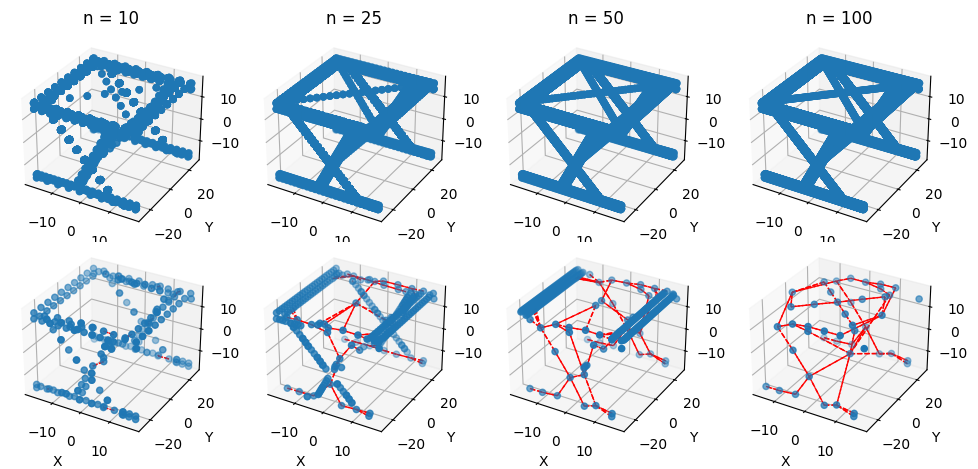

In [104]:
plot(4000, n = [10,25,50,100], threshold = 10, num_intervals = 7, argument = 0, eps = 1)

In [65]:
def plot_n_graphs(indexes, n = 100, threshold = 10, num_intervals = 5, argument = 0, eps = 1):
    for index in indexes:
        plot(index, n = n, threshold = threshold, num_intervals = num_intervals, argument = argument, eps = eps)

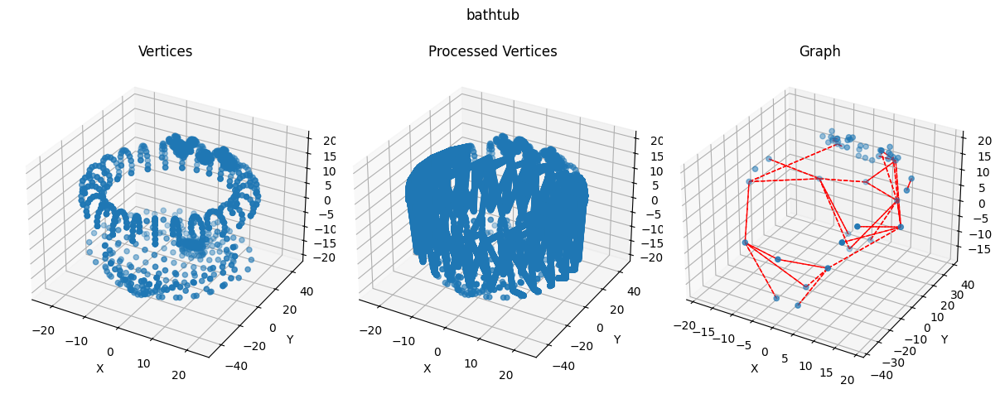

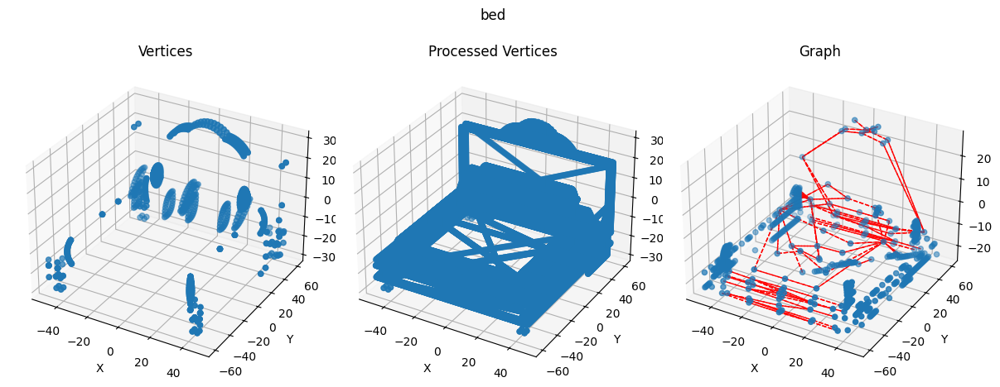

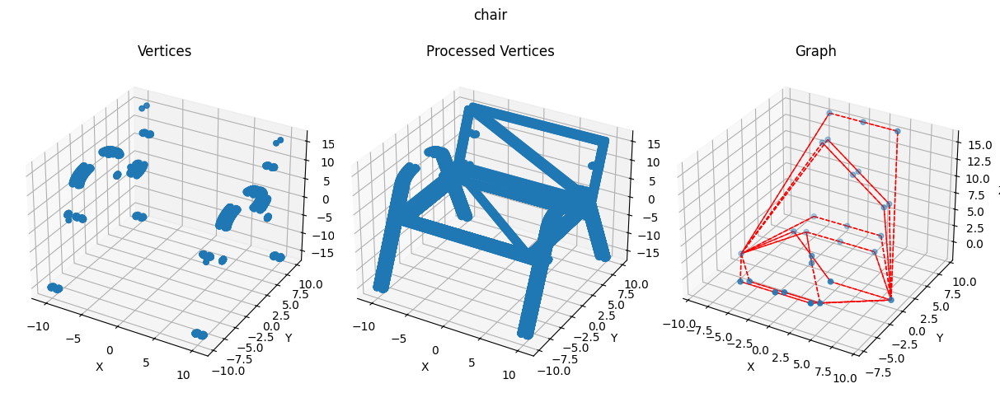

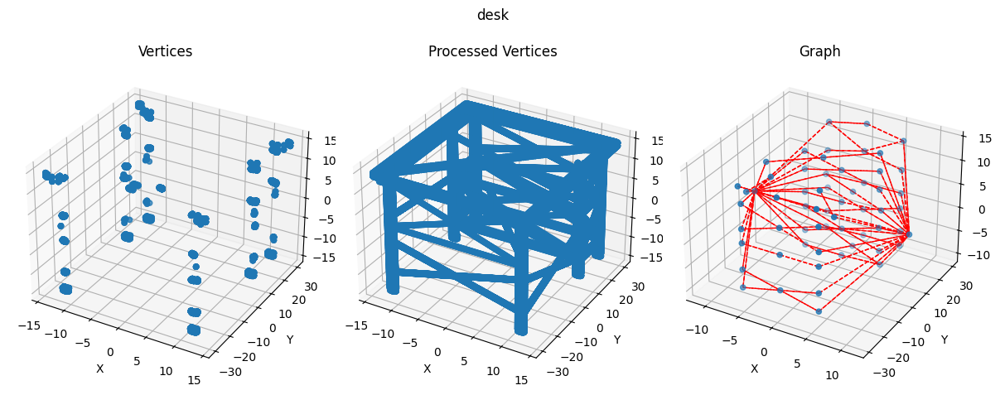

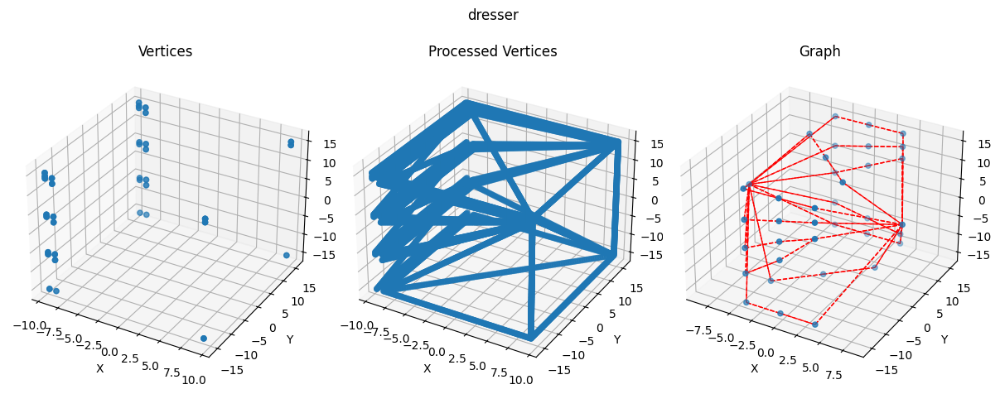

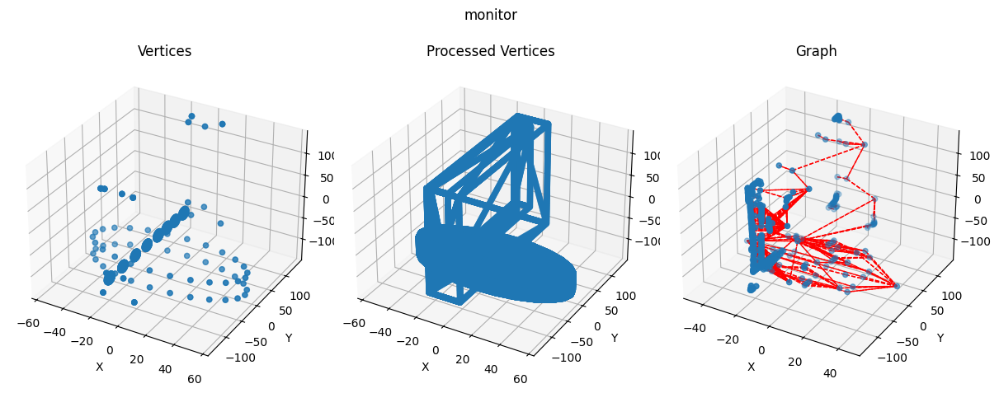

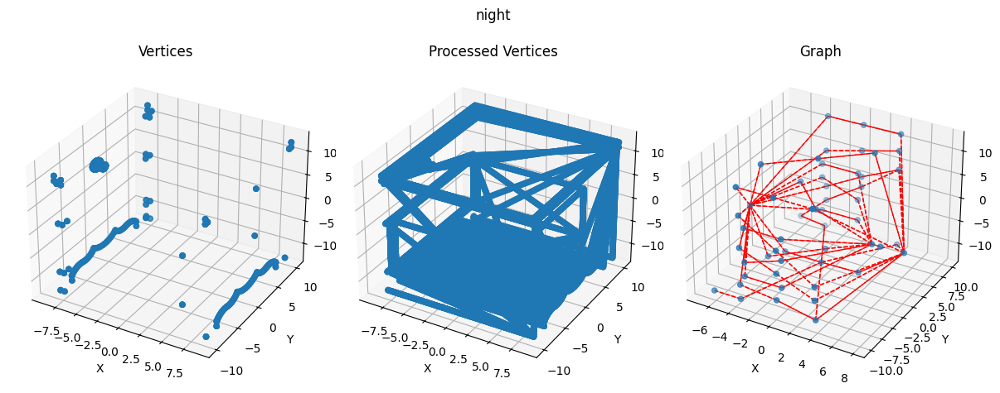

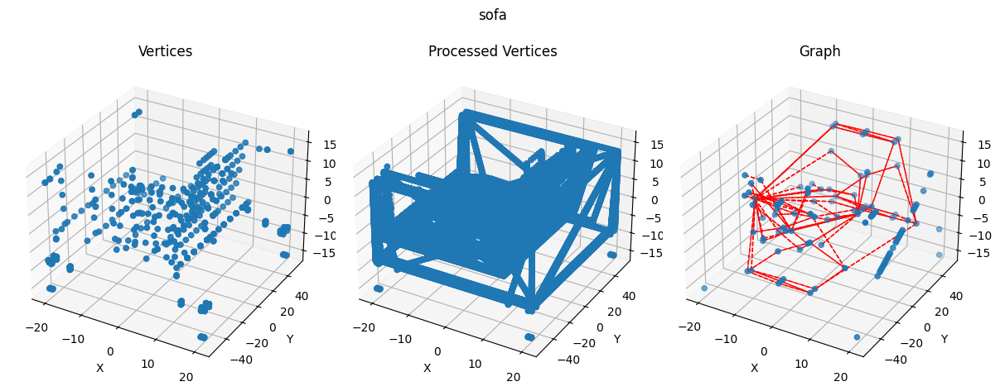

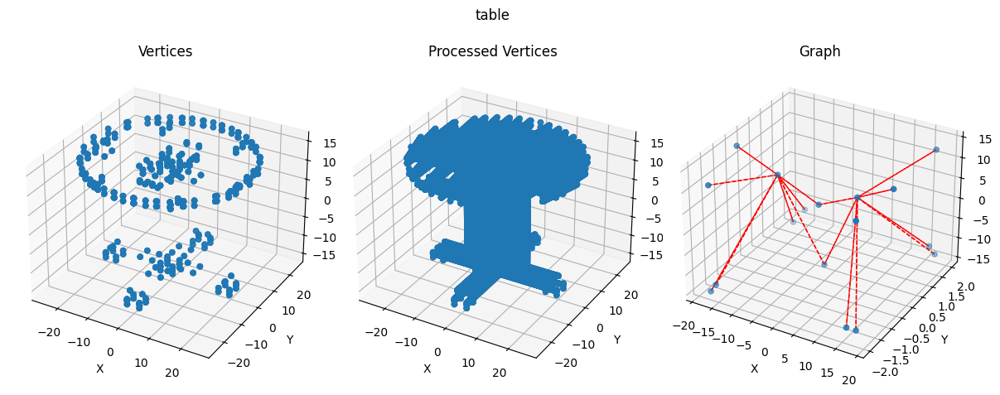

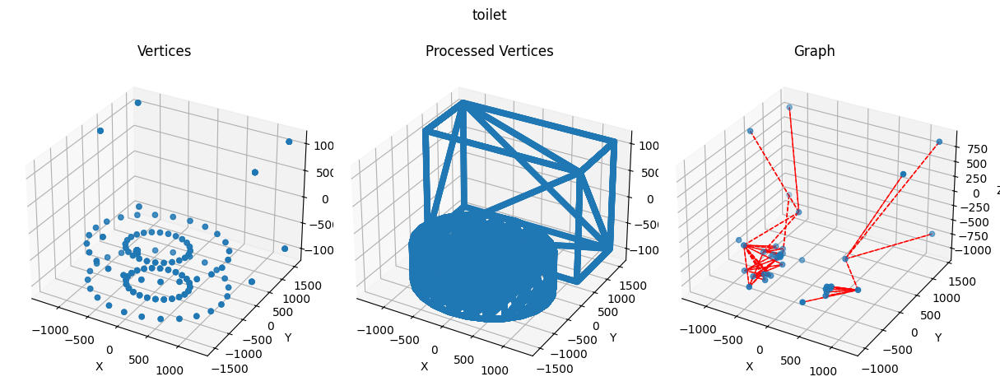

In [71]:
plot_n_graphs([0 ,500, 1000, 1900, 2200, 2600, 3000, 3500, 4100, 4700])

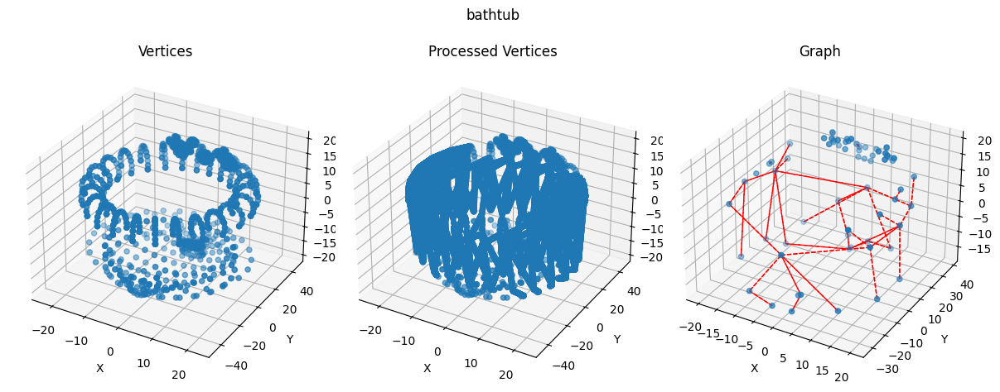

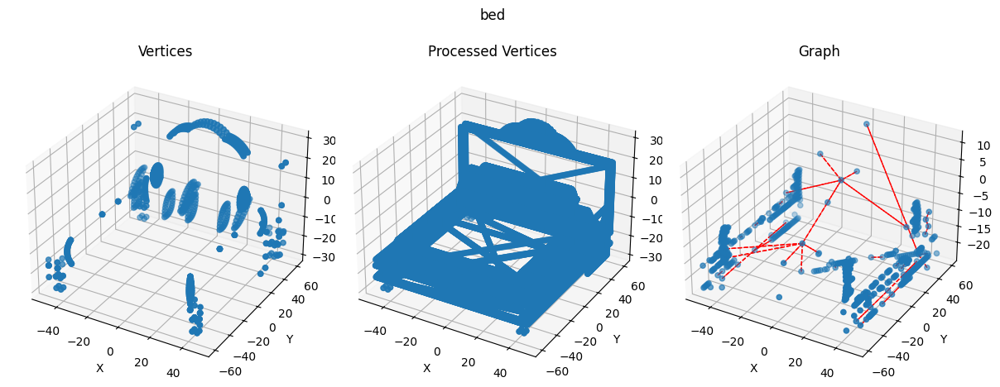

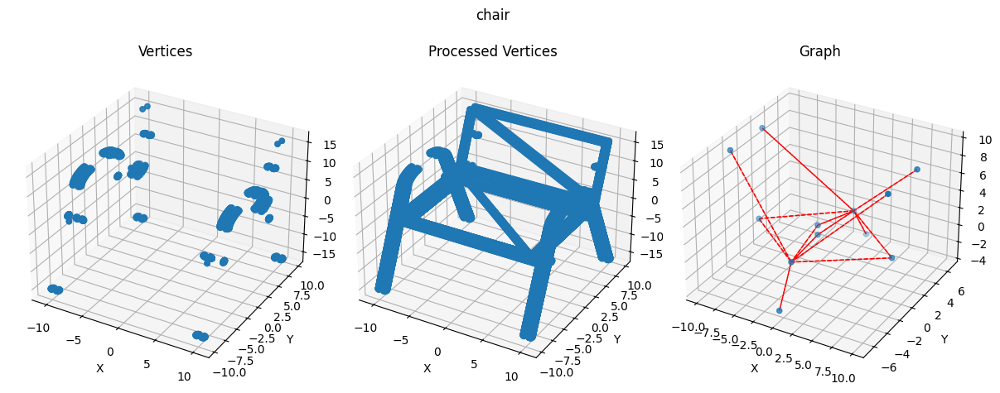

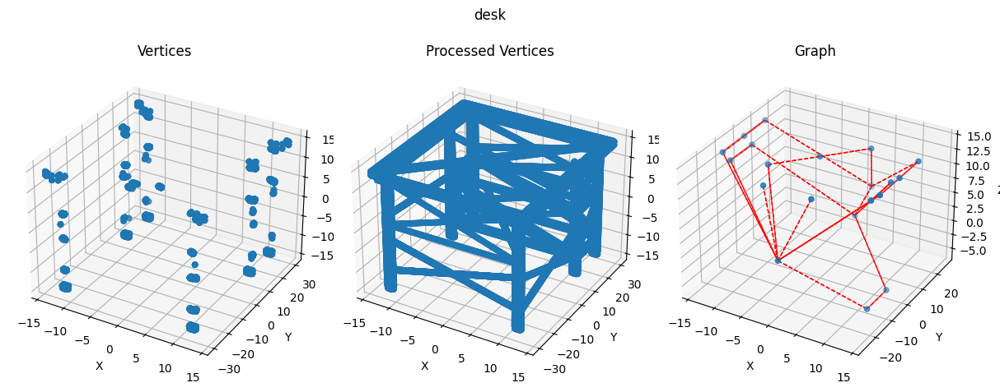

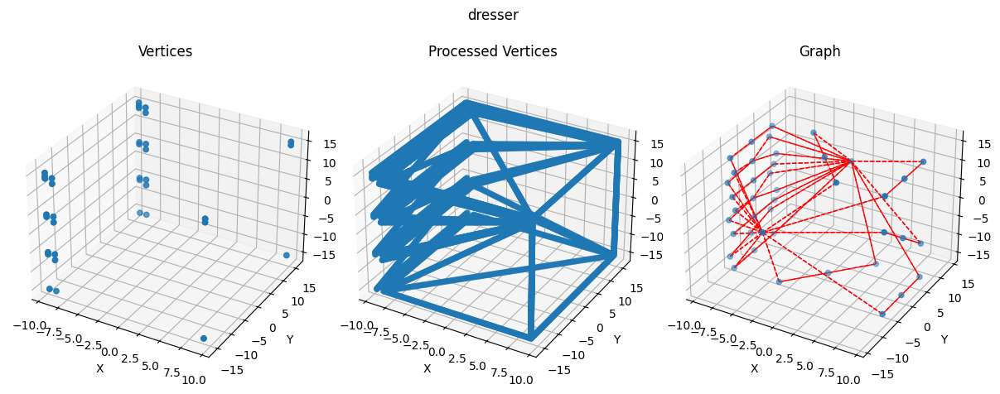

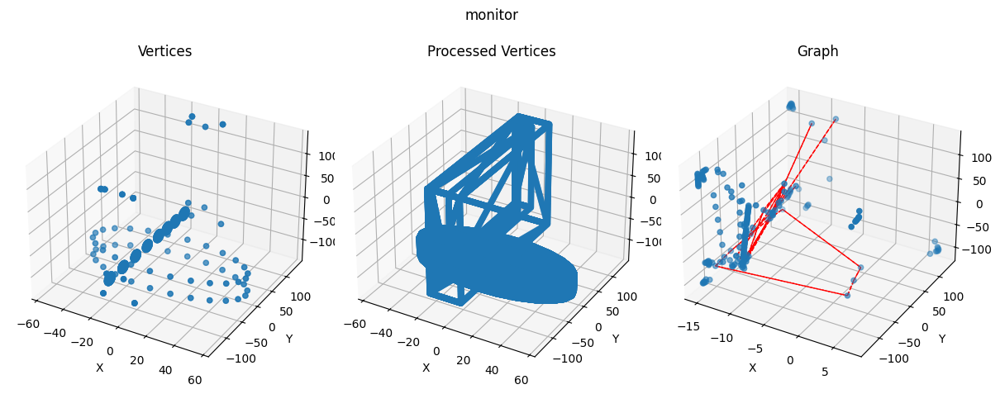

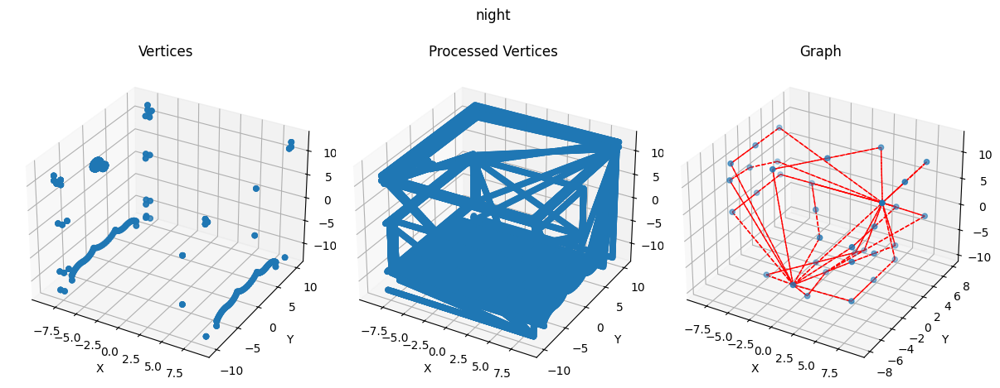

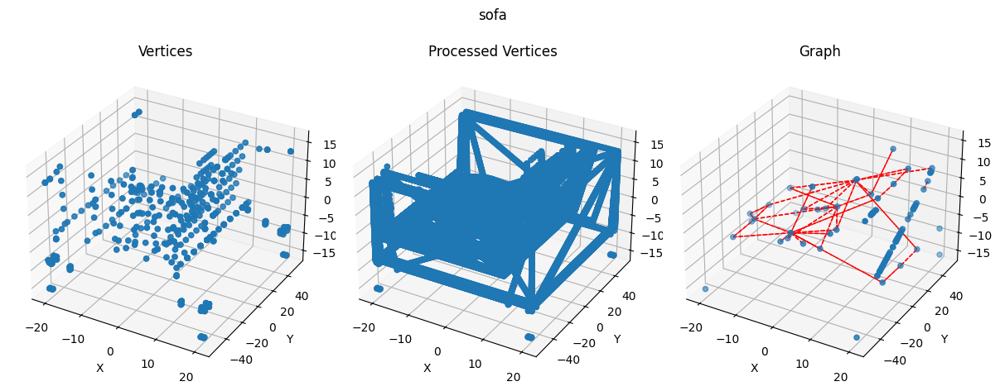

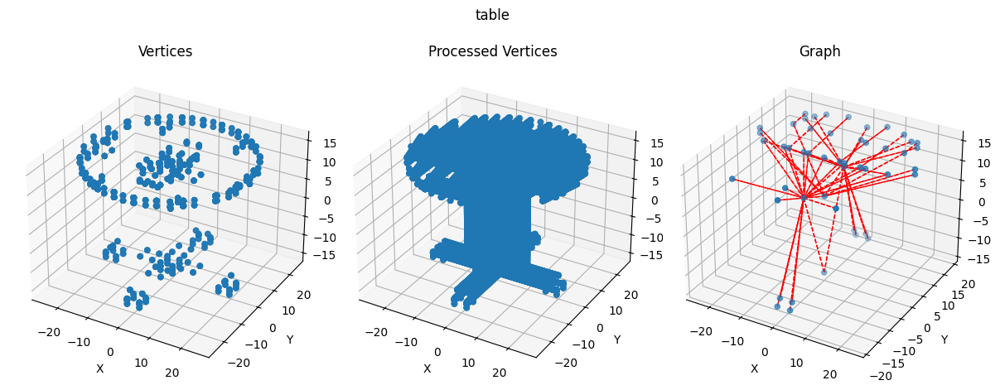

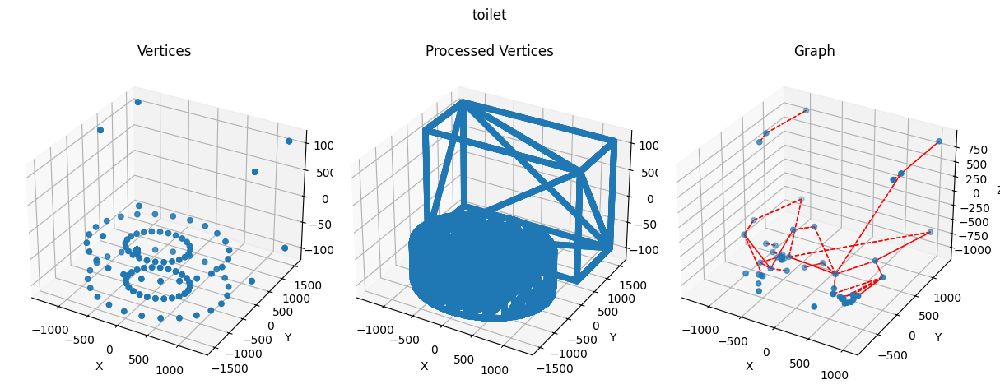

In [72]:
plot_n_graphs([0 ,500, 1000, 1900, 2200, 2600, 3000, 3500, 4100, 4700], argument= 1)

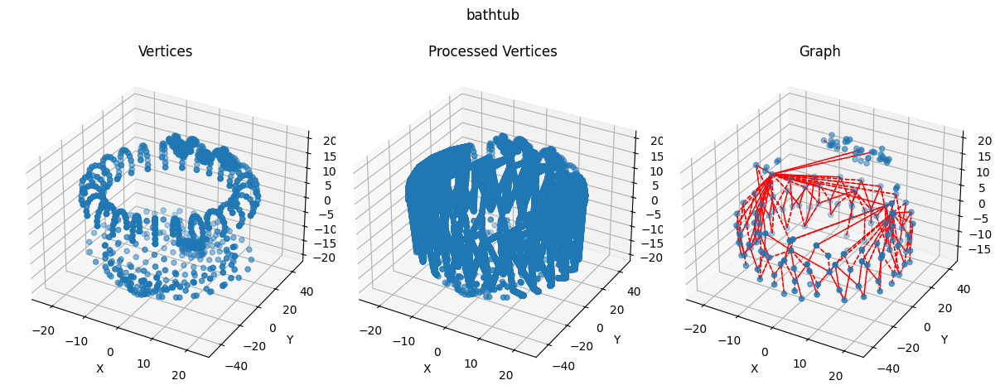

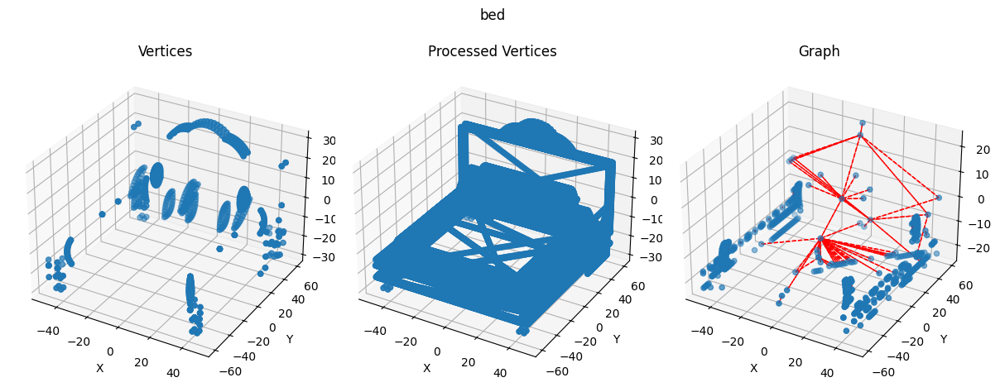

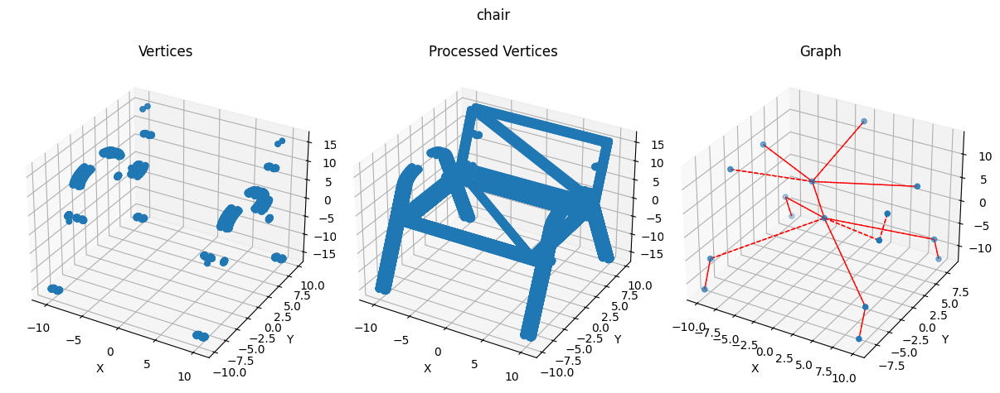

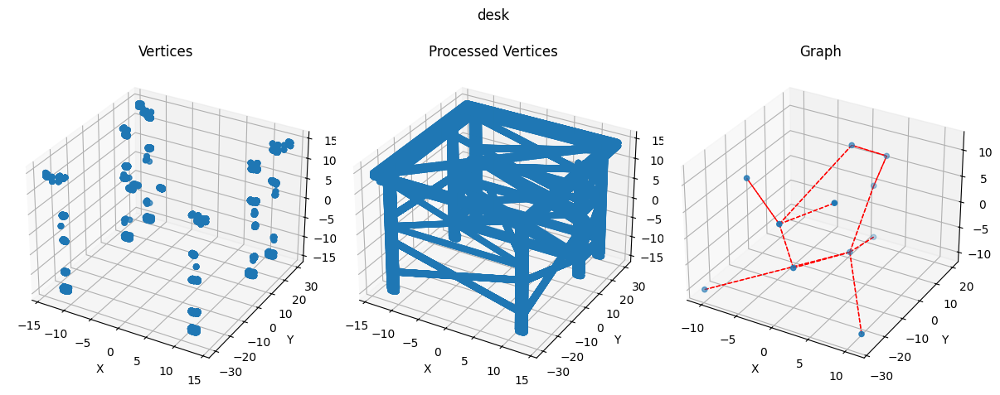

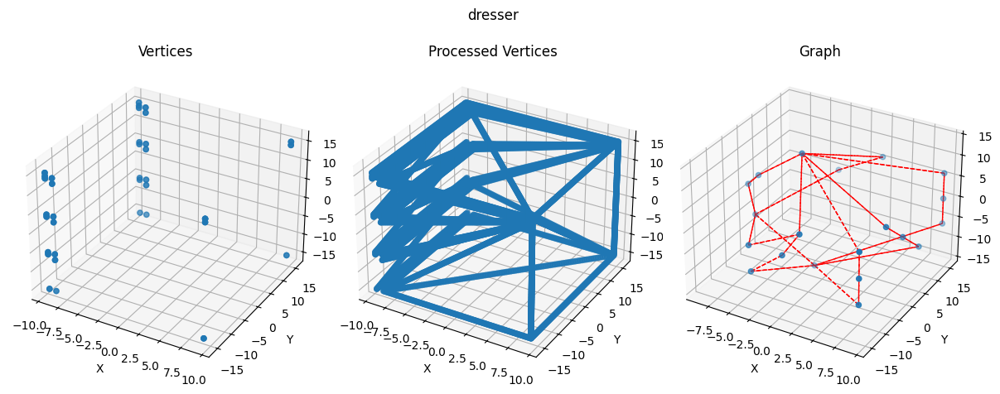

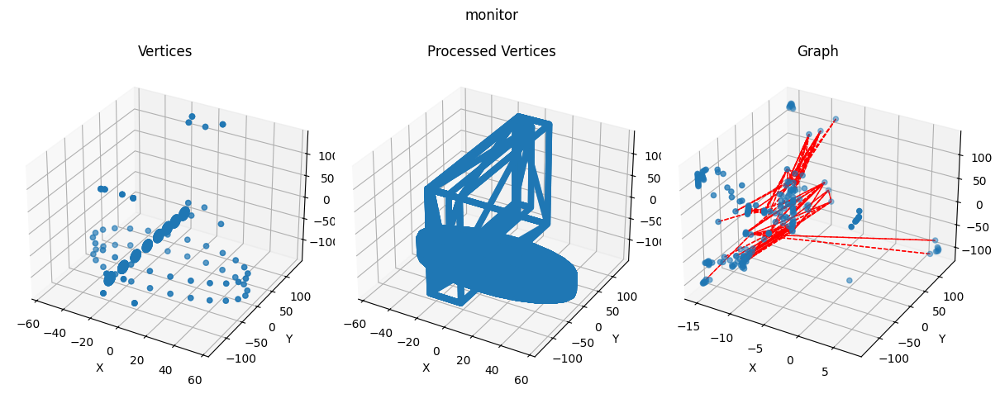

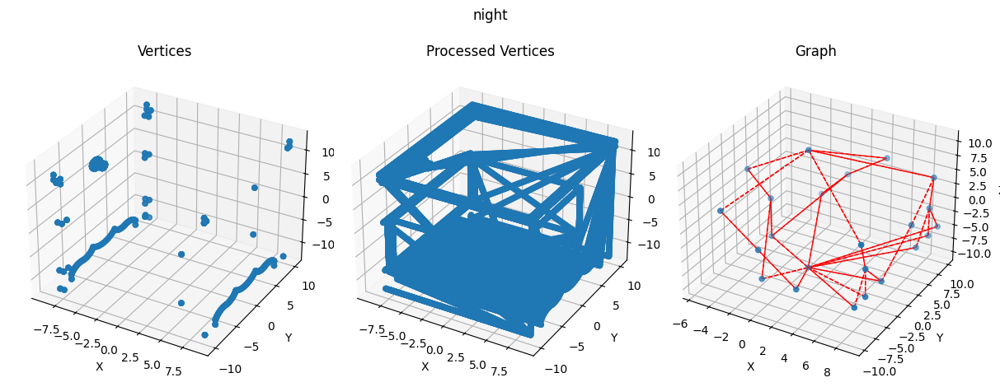

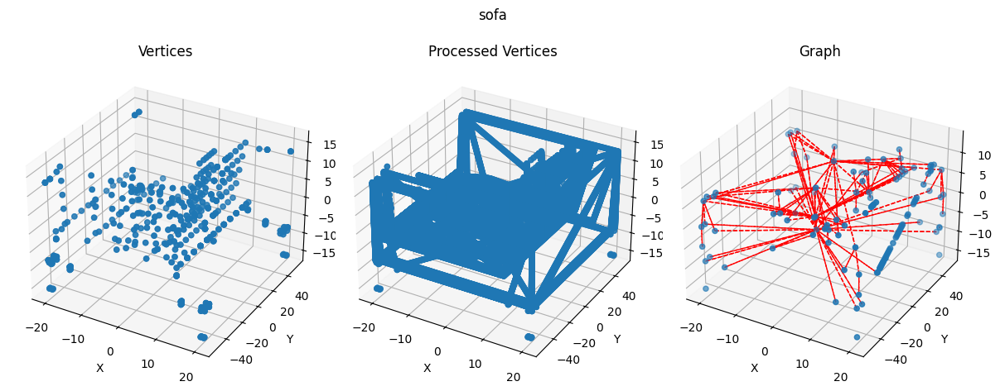

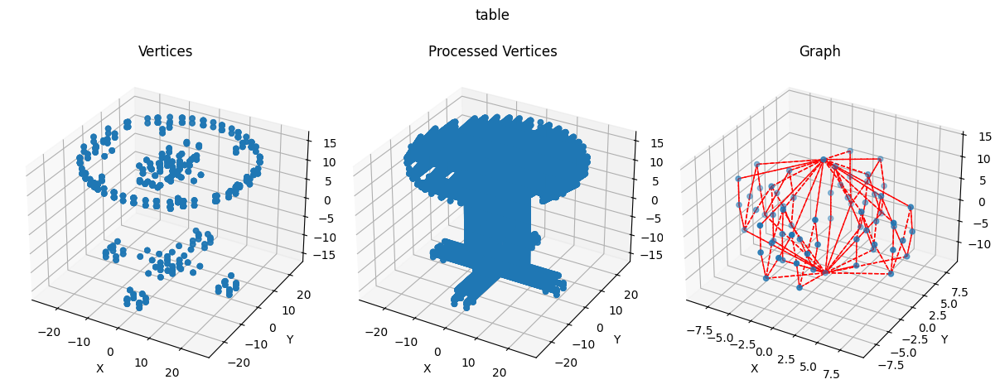

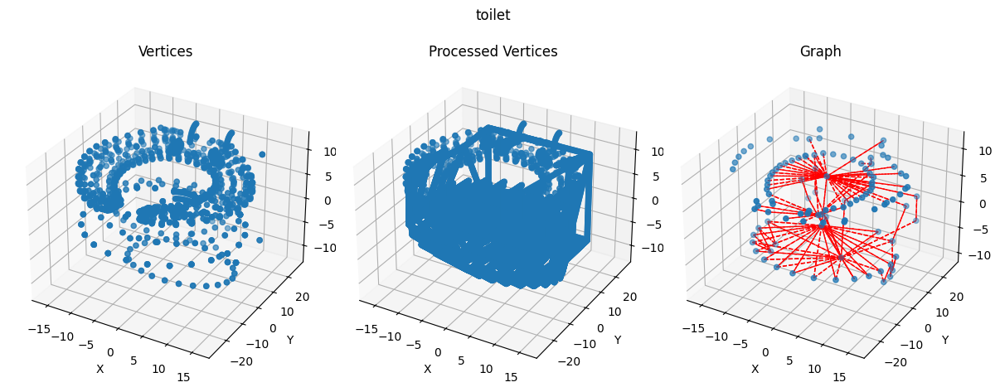

In [73]:
plot_n_graphs([0 ,500, 1000, 1900, 2200, 2600, 3000, 3500, 4100, 4701], argument= 2)

Converting Dataset to Graph

In [ ]:
# Get the total number of entries in the DataFrame
n = len(df)

# Iterate through each index in the DataFrame
for index in range(n):
    try:
        # Attempt to convert the current index into a graph
        index_to_graph(index, n=100, threshold=10, num_intervals=7, argument=0, eps=1, write_to_file=True)
        
        # Print a success message
        print(f'Converted {index + 1}/{n}')
    
    except ValueError as e:
        # Handle the case where the conversion to a graph failed due to a ValueError
        print(f"Couldn't convert {index + 1} into a graph because of {e}.")
    
    except FileNotFoundError as e:
        # Handle the case where the file required for conversion is not found
        print(f"Couldn't convert {index + 1} because the file is not found.")
    
    except MemoryError as e:
        # Handle the case where a MemoryError occurs during the conversion
        print(f"Memory error on {index + 1}")

In [ ]:
# Get the total number of entries in the DataFrame
n = len(df)

# Iterate through each index in the DataFrame
for index in range(n):
    try:
        # Attempt to convert the current index into a graph
        index_to_graph(index, n=100, threshold=10, num_intervals=7, argument=1, eps=1, write_to_file=True)
        
        # Print a success message
        print(f'Converted {index + 1}/{n}')
    
    except ValueError as e:
        # Handle the case where the conversion to a graph failed due to a ValueError
        print(f"Couldn't convert {index + 1} into a graph because of {e}.")
    
    except FileNotFoundError as e:
        # Handle the case where the file required for conversion is not found
        print(f"Couldn't convert {index + 1} because the file is not found.")
    
    except MemoryError as e:
        # Handle the case where a MemoryError occurs during the conversion
        print(f"Memory error on {index + 1}")

In [ ]:
# Get the total number of entries in the DataFrame
n = len(df)

# Iterate through each index in the DataFrame
for index in range(n):
    try:
        # Attempt to convert the current index into a graph
        index_to_graph(index, n=100, threshold=10, num_intervals=7, argument = 2, eps=1, write_to_file=True)
        
        # Print a success message
        print(f'Converted {index + 1}/{n}')
    
    except ValueError as e:
        # Handle the case where the conversion to a graph failed due to a ValueError
        print(f"Couldn't convert {index + 1} into a graph because of {e}.")
    
    except FileNotFoundError as e:
        # Handle the case where the file required for conversion is not found
        print(f"Couldn't convert {index + 1} because the file is not found.")
    
    except MemoryError as e:
        # Handle the case where a MemoryError occurs during the conversion
        print(f"Memory error on {index + 1}")

In [10]:
class CustomGraphDataset(Dataset):
    def __init__(self, root, split='train', transform=None):
         # Initialize the dataset with the root directory, split, and optional transform
        self.root = root
        self.split = split
        self.transform = transform
        self.graph_files = []

        classes = os.listdir(root) # Get the list of classes (subdirectories) in the root directory

        # Iterate through each class
        for class_folder in classes:
            class_path = os.path.join(root, class_folder)
            
            # Check if the class folder is a directory
            if os.path.isdir(class_path):
                # Create the path to the split folder (train, test, etc.) within the class folder
                split_folder = os.path.join(class_path, split)
                
                # Get the list of graph files (with the .gph extension) in the split folder
                graph_files = [os.path.join(split_folder, f) for f in os.listdir(split_folder) if f.endswith('.gph')]
                
                # Extend the list of graph files in the dataset with the current class's graph files
                self.graph_files.extend(graph_files)

    def __len__(self): # Return the total number of graph files in the dataset
        return len(self.graph_files)

    def __getitem__(self, idx):
        # Get the file path of the graph file at the specified index
        graph_file = self.graph_files[idx]
        
        # Load the graph data from the file using torch
        data = torch.load(graph_file)
        
        # Add ground truth label based on class (assuming class names in the file paths)
        class_label = None
        for i, class_name in enumerate(['bathtub', 'bed', 'chair', 'desk', 'dresser', 'monitor', 'night', 'sofa', 'table', 'toilet']):
            if class_name in graph_file:
                class_label = i
                break

        # Check if class_label is still None, indicating an unknown class
        if class_label is None:
            raise ValueError(f"Unknown class for file: {graph_file}")

        # Set the ground truth label as a tensor in the 'y' attribute of the graph data
        data.y = torch.tensor([class_label], dtype=torch.long)

        # Apply the transform if provided
        if self.transform:
            data = self.transform(data)

        return data


# Load the graph data using the CustomGraphDataset
def load_graph_data(filepath):
    dataset = CustomGraphDataset(filepath, transform=Constant())
    return dataset

GNN Model

In [11]:
# Define the Graph Neural Network model
class GNNModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(GNNModel, self).__init__()
        # Graph convolutional layers
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.conv3 = GCNConv(hidden_dim, output_dim)

    def forward(self, data):
        x, edge_index, batch = data.x, data.edge_index, data.batch

        # Apply the first graph convolutional layer followed by ReLU activation
        x = self.conv1(x, edge_index)
        x = torch.relu(x)

        # Apply the second graph convolutional layer followed by ReLU activation
        x = self.conv2(x, edge_index)
        x = torch.relu(x)

        # Apply the third graph convolutional layer
        x = self.conv3(x, edge_index)

        # Global mean pooling over the nodes in each graph in the batch
        x = global_mean_pool(x, batch)

        # Apply log_softmax for classification
        return torch.log_softmax(x, dim=1)

    def save_model(self, filepath):
        # Save the model's state_dict to the specified filepath
        torch.save(self.state_dict(), filepath)
        print(f'Model saved to {filepath}')

    def load_model(self, filepath):
        # Load the model's state_dict from the specified filepath
        self.load_state_dict(torch.load(filepath))
        print(f'Model loaded from {filepath}')

# Train the GNN model
def train(model, train_loader, optimizer, criterion, device):
    model.train()
    total_loss = 0.0
    correct_train = 0
    total_train = 0

    for data in train_loader:
        data = data.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = criterion(output, data.y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

        _, predicted = output.max(1)
        total_train += data.y.size(0)
        correct_train += predicted.eq(data.y).sum().item()

    accuracy_train = correct_train / total_train
    average_loss = total_loss / len(train_loader)
    return accuracy_train, average_loss

# Evaluate the GNN model
def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss = 0.0
    correct_eval = 0
    total_eval = 0

    with torch.no_grad():
        for data in loader:
            data = data.to(device)
            output = model(data)
            loss = criterion(output, data.y)

            total_loss += loss.item()

            _, predicted = output.max(1)
            total_eval += data.y.size(0)
            correct_eval += predicted.eq(data.y).sum().item()

    accuracy_eval = correct_eval / total_eval
    average_loss = total_loss / len(loader)
    return accuracy_eval, average_loss

In [12]:
# Function to plot training and testing results
def plot_results(train_losses, train_accuracies, test_losses, test_accuracies):
    plt.figure(figsize=(12, 4))

    # Plotting training loss and test loss
    plt.subplot(1, 2, 1)
    plt.plot(train_losses, label='Train Loss')
    plt.plot(test_losses, label='Test Loss')
    plt.title('Training and Test Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plotting training accuracy and test accuracy
    plt.subplot(1, 2, 2)
    plt.plot(train_accuracies, label='Train Accuracy')
    plt.plot(test_accuracies, label='Test Accuracy')
    plt.title('Training and Test Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout()
    plt.show()


In [13]:
# Main function to train and evaluate the GNN model
def main(root_path, lr=0.01, epochs=100, batch_size=64, plot_graphs=False):

    # Define the output path for saving the trained model
    output_path = 'Saved/' + root_path + '/'
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    output_path += 'lr' + str(lr) + 'bs' + str(batch_size) + '.pt'

    # Set device (use GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Create training and testing datasets
    train_dataset = CustomGraphDataset(root_path, split='train', transform=Constant())
    test_dataset = CustomGraphDataset(root_path, split='test', transform=Constant())

    # Define GNN model
    input_dim = 8
    hidden_dim = 64
    output_dim = 10
    model = GNNModel(input_dim, hidden_dim, output_dim).to(device)

    # Define optimizer and loss function
    optimizer = optim.Adam(model.parameters(), lr)
    criterion = nn.NLLLoss()

    # Prepare data loader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Evaluate the model before training and print initial results
    test_acc, test_loss = evaluate(model, test_loader, criterion, device)
    print(f'Epoch {0}/{epochs} => '
          f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')

    # Lists to store results for plotting
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []

    # Train the model and capture results
    for epoch in range(1, epochs + 1):
        train_acc, train_loss = train(model, train_loader, optimizer, criterion, device)
        test_acc, test_loss = evaluate(model, test_loader, criterion, device)

        train_accuracies.append(train_acc)
        train_losses.append(train_loss)
        test_accuracies.append(test_acc)
        test_losses.append(test_loss)

        if epoch % 5 == 0:
            print(f'Epoch {epoch}/{epochs} => '
                  f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_acc:.4f} | '
                  f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')

    # Plotting the results if plot_graphs is True
    if plot_graphs:
        plot_results(train_losses, train_accuracies, test_losses, test_accuracies)

    # Save the trained model
    model.save_model(output_path)
    return model


Training on different parameters

In [14]:
def load_model(model_path, root_path = '', input_dim = 8, hidden_dim = 64, output_dim = 10, evaluate_model = False):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # Set device (use GPU if available)
    
    model = GNNModel(input_dim, hidden_dim, output_dim).to(device) #Create the model
    model.load_model(model_path) # Load Model
    if (evaluate_model):
        #Create testing datasets and Prepare data loader
        test_dataset = CustomGraphDataset(root_path, split='test', transform=Constant())
        test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
        criterion = nn.NLLLoss() #loss function
        test_acc, test_loss = evaluate(model, test_loader, criterion, device) #Evaluate the model
        print(f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')
    return model

In [15]:
def train_further(model,root_path, lr=0.01, epochs=100, batch_size=64, plot_graphs=False, output_path = 'default.pt'):
    # Set device (use GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Create training and testing datasets
    train_dataset = CustomGraphDataset(root_path, split='train', transform=Constant())
    test_dataset = CustomGraphDataset(root_path, split='test', transform=Constant())

    # Define optimizer and loss function
    optimizer = optim.Adam(model.parameters(), lr)
    criterion = nn.NLLLoss()

    # Prepare data loader
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Lists to store results for plotting
    train_losses = []
    train_accuracies = []
    test_losses = []
    test_accuracies = []

    # Train the model and capture results
    for epoch in range(1, epochs + 1):
        train_acc, train_loss = train(model, train_loader, optimizer, criterion, device)
        test_acc, test_loss = evaluate(model, test_loader, criterion, device)

        train_accuracies.append(train_acc)
        train_losses.append(train_loss)
        test_accuracies.append(test_acc)
        test_losses.append(test_loss)

        print(f'Epoch {epoch}/{epochs} => '
                f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_acc:.4f} | '
                f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')

    # Plotting the results if plot_graphs is True
    if plot_graphs:
        plot_results(train_losses, train_accuracies, test_losses, test_accuracies)

    # Save the trained model
    model.save_model(output_path)
    return model


In [45]:
def plot_different_batch_sizes(root_path, lr=0.01, epochs=20, batch_sizes=[], print_accuracy = 'train'):

    # Set device (use GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Create training and testing datasets
    train_dataset = CustomGraphDataset(root_path, split='train', transform=Constant())
    test_dataset = CustomGraphDataset(root_path, split='test', transform=Constant())

    
    input_dim = 8
    hidden_dim = 64
    output_dim = 10

    btrain_losses = []
    btrain_accuracies = []
    btest_losses = []
    btest_accuracies = []

    for batch_size in batch_sizes:
        # Lists to store results for plotting
        train_losses = []
        train_accuracies = []
        test_losses = []
        test_accuracies = []

        # Define GNN model
        model = GNNModel(input_dim, hidden_dim, output_dim).to(device)

        # Define optimizer and loss function
        optimizer = optim.Adam(model.parameters(), lr)
        criterion = nn.NLLLoss()
        
        

        # Prepare data loader
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

        for epoch in range(1, epochs + 1):
            train_acc, train_loss = train(model, train_loader, optimizer, criterion, device)
            test_acc, test_loss = evaluate(model, test_loader, criterion, device)

            train_accuracies.append(train_acc)
            train_losses.append(train_loss)
            test_accuracies.append(test_acc)
            test_losses.append(test_loss)
        if epoch % 5 == 0:
            print(f'Epoch {epoch}/{epochs}, Batch Size {batch_size} => '
                    f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_acc:.4f} | '
                    f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')
        btrain_losses.append(train_losses)
        btrain_accuracies.append(train_accuracies)
        btest_losses.append(test_losses)
        btest_accuracies.append(test_accuracies)
    plt.figure(figsize=(12, 4))
    
    if print_accuracy == 'train':
        plt.suptitle('Train Loss and Accuracy Across Different Batch Sizes')
        # Plotting training loss across multiple batch sizes
        for i in range(len(btrain_losses)):
            plt.subplot(1, 2, 1)
            plt.plot(btrain_losses[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Training Loss over Epochs Across different batch sizes')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            # Plotting training accuracies across multiple batch sizes
            plt.subplot(1, 2, 2)
            plt.plot(btrain_accuracies[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Training Accuracy over Epochs Across different batch sizes')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

        

    if print_accuracy == 'test':
        plt.suptitle('Test Loss and Accuracy Across Different Batch Sizes')
        # Plotting test loss across multiple batch sizes
        for i in range(len(btrain_losses)):
            plt.subplot(1, 2, 1)
            plt.plot(btest_losses[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Test Loss over Epochs Across different batch sizes')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            # Plotting test accuracies across multiple batch sizes
            plt.subplot(1, 2, 2)
            plt.plot(btest_accuracies[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Test Accuracy over Epochs Across different batch sizes')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()
    if print_accuracy == 'both':
        plt.suptitle('Train/Test Loss and Accuracy Across Different Batch Sizes')
        for i in range(len(btrain_losses)):
            plt.subplot(1, 4, 1)
            plt.plot(btrain_losses[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Training Loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            plt.subplot(1, 4, 2)
            plt.plot(btest_losses[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Test Loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()


            # Plotting training accuracies across multiple batch sizes
            plt.subplot(1, 4, 3)
            plt.plot(btrain_accuracies[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Training Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

            
            # Plotting test accuracies across multiple batch sizes
            plt.subplot(1, 4, 4)
            plt.plot(btest_accuracies[i], label=f'batchsize: {batch_sizes[i]}')
            plt.title('Test Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

    plt.tight_layout()
    plt.show()


In [50]:
def plot_different_learning_rates(root_path, lrs=[0.05,0.01,0.005,0.001,0.0005], epochs=20, batch_size=16, print_accuracy = 'train'):

    # Set device (use GPU if available)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    # Create training and testing datasets
    train_dataset = CustomGraphDataset(root_path, split='train', transform=Constant())
    test_dataset = CustomGraphDataset(root_path, split='test', transform=Constant())

    
    input_dim = 8
    hidden_dim = 64
    output_dim = 10

    btrain_losses = []
    btrain_accuracies = []
    btest_losses = []
    btest_accuracies = []

    for lr in lrs:
        # Lists to store results for plotting
        train_losses = []
        train_accuracies = []
        test_losses = []
        test_accuracies = []

        # Define GNN model
        model = GNNModel(input_dim, hidden_dim, output_dim).to(device)

        # Define optimizer and loss function
        optimizer = optim.Adam(model.parameters(), lr)
        criterion = nn.NLLLoss()
        
        

        # Prepare data loader
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

        for epoch in range(1, epochs + 1):
            train_acc, train_loss = train(model, train_loader, optimizer, criterion, device)
            test_acc, test_loss = evaluate(model, test_loader, criterion, device)

            train_accuracies.append(train_acc)
            train_losses.append(train_loss)
            test_accuracies.append(test_acc)
            test_losses.append(test_loss)
        if epoch % 5 == 0:
            print(f'Epoch {epoch}/{epochs}, learning rate: {lr} => '
                    f'Train Loss: {train_loss:.4f}, Train Accuracy: {train_acc:.4f} | '
                    f'Test Loss: {test_loss:.4f}, Test Accuracy: {test_acc:.4f}')
        btrain_losses.append(train_losses)
        btrain_accuracies.append(train_accuracies)
        btest_losses.append(test_losses)
        btest_accuracies.append(test_accuracies)
    plt.figure(figsize=(12, 4))
    
    if print_accuracy == 'train':
        plt.suptitle('Train Loss and Accuracy Across Different learning rates')
        # Plotting training loss across multiple batch sizes
        for i in range(len(btrain_losses)):
            plt.subplot(1, 2, 1)
            plt.plot(btrain_losses[i], label=f'learning rate: {lrs[i]}')
            plt.title('Training Loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            # Plotting training accuracies across multiple batch sizes
            plt.subplot(1, 2, 2)
            plt.plot(btrain_accuracies[i], label=f'learning rate: {lrs[i]}')
            plt.title('Training Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

        

    if print_accuracy == 'test':
        plt.suptitle('Test Loss and Accuracy Across Different learning rates')
        # Plotting test loss across multiple batch sizes
        for i in range(len(btrain_losses)):
            plt.subplot(1, 2, 1)
            plt.plot(btest_losses[i], label=f'learning rate: {lrs[i]}')
            plt.title('Test Loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            # Plotting test accuracies across multiple batch sizes
            plt.subplot(1, 2, 2)
            plt.plot(btest_accuracies[i], label=f'learning rate: {lrs[i]}')
            plt.title('Test Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()
    if print_accuracy == 'both':
        plt.suptitle('Train/Test Loss and Accuracy Across Different learning rates')
        for i in range(len(btrain_losses)):
            plt.subplot(1, 4, 1)
            plt.plot(btrain_losses[i], label=f'learning rate: {lrs[i]}')
            plt.title('Training Loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()

            plt.subplot(1, 4, 2)
            plt.plot(btest_losses[i], label=f'learning rate: {lrs[i]}')
            plt.title('Test Loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.legend()


            # Plotting training accuracies across multiple batch sizes
            plt.subplot(1, 4, 3)
            plt.plot(btrain_accuracies[i], label=f'learning rate: {lrs[i]}')
            plt.title('Training Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

            
            # Plotting test accuracies across multiple batch sizes
            plt.subplot(1, 4, 4)
            plt.plot(btest_accuracies[i], label=f'learning rate: {lrs[i]}')
            plt.title('Test Accuracy')
            plt.xlabel('Epochs')
            plt.ylabel('Accuracy')
            plt.legend()

    plt.tight_layout()
    plt.show()


c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 10/10, Batch Size 256 => Train Loss: 1.1469, Train Accuracy: 0.6374 | Test Loss: 1.4018, Test Accuracy: 0.4928
Epoch 10/10, Batch Size 512 => Train Loss: 1.6212, Train Accuracy: 0.5563 | Test Loss: 1.7948, Test Accuracy: 0.4209


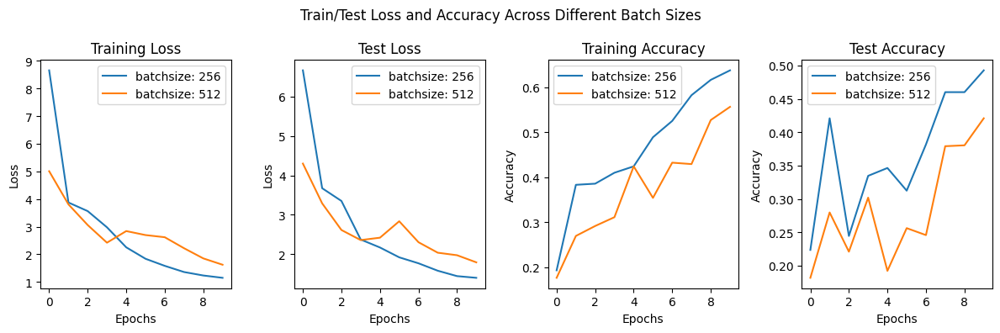

In [46]:
plot_different_batch_sizes("3DGraphz7", lr = 0.01, epochs=10, batch_sizes=[256,512], print_accuracy='both')

Epoch 20/20, Batch Size 2 => Train Loss: 0.9041, Train Accuracy: 0.7611 | Test Loss: 4.1561, Test Accuracy: 0.6889
Epoch 20/20, Batch Size 4 => Train Loss: 0.8263, Train Accuracy: 0.7728 | Test Loss: 1.1354, Test Accuracy: 0.6497
Epoch 20/20, Batch Size 8 => Train Loss: 0.7677, Train Accuracy: 0.7737 | Test Loss: 0.9480, Test Accuracy: 0.7216
Epoch 20/20, Batch Size 16 => Train Loss: 0.8880, Train Accuracy: 0.7346 | Test Loss: 1.1140, Test Accuracy: 0.6693
Epoch 20/20, Batch Size 32 => Train Loss: 0.8987, Train Accuracy: 0.7223 | Test Loss: 1.0464, Test Accuracy: 0.6693
Epoch 20/20, Batch Size 64 => Train Loss: 1.0260, Train Accuracy: 0.6867 | Test Loss: 1.2785, Test Accuracy: 0.5974
Epoch 20/20, Batch Size 128 => Train Loss: 1.0385, Train Accuracy: 0.6904 | Test Loss: 1.2255, Test Accuracy: 0.5987
Epoch 20/20, Batch Size 256 => Train Loss: 1.3749, Train Accuracy: 0.6213 | Test Loss: 1.5479, Test Accuracy: 0.4928
Epoch 20/20, Batch Size 512 => Train Loss: 1.6592, Train Accuracy: 0.5658

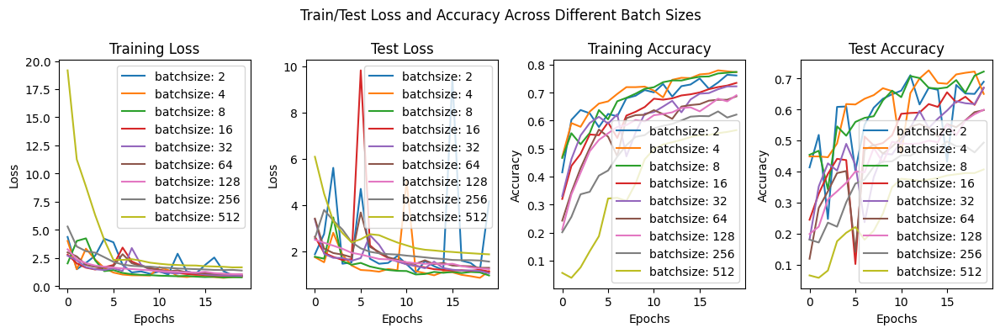

In [48]:
plot_different_batch_sizes("3DGraphz7", lr = 0.001, epochs=20, batch_sizes=[2,4,8,16,32,64,128,256,512], print_accuracy='both')

Epoch 20/20, learning rate: 0.05 => Train Loss: 2.1780, Train Accuracy: 0.1922 | Test Loss: 2.4062, Test Accuracy: 0.1020
Epoch 20/20, learning rate: 0.01 => Train Loss: 1.3885, Train Accuracy: 0.6835 | Test Loss: 2.5001, Test Accuracy: 0.5856
Epoch 20/20, learning rate: 0.005 => Train Loss: 1.2406, Train Accuracy: 0.7280 | Test Loss: 2.1136, Test Accuracy: 0.6340
Epoch 20/20, learning rate: 0.001 => Train Loss: 0.7902, Train Accuracy: 0.7665 | Test Loss: 1.0217, Test Accuracy: 0.7046
Epoch 20/20, learning rate: 0.0005 => Train Loss: 1.0673, Train Accuracy: 0.7097 | Test Loss: 1.3136, Test Accuracy: 0.6549


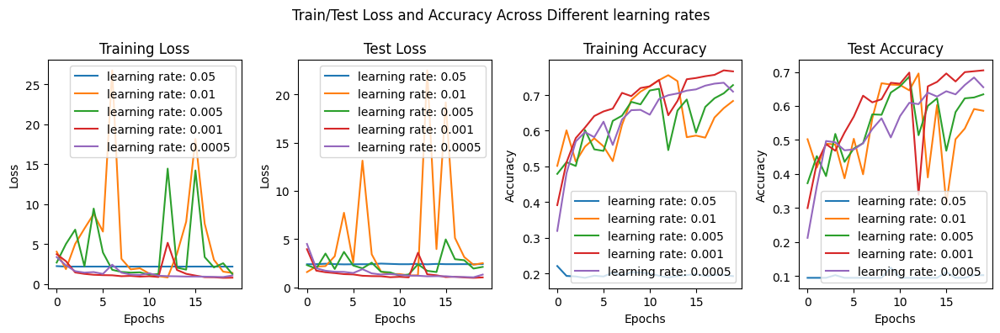

In [52]:
plot_different_learning_rates("3DGraphz7", epochs=20, batch_size=8, print_accuracy='both')

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 0/100 => Test Loss: 6.8484, Test Accuracy: 0.1085
Epoch 5/100 => Train Loss: 1.3167, Train Accuracy: 0.6213 | Test Loss: 1.5019, Test Accuracy: 0.5412
Epoch 10/100 => Train Loss: 1.0225, Train Accuracy: 0.6993 | Test Loss: 1.2724, Test Accuracy: 0.5948
Epoch 15/100 => Train Loss: 0.9521, Train Accuracy: 0.7352 | Test Loss: 1.1474, Test Accuracy: 0.6418
Epoch 20/100 => Train Loss: 0.7460, Train Accuracy: 0.7876 | Test Loss: 1.0026, Test Accuracy: 0.6863
Epoch 25/100 => Train Loss: 3.1538, Train Accuracy: 0.7412 | Test Loss: 0.9314, Test Accuracy: 0.7346
Epoch 30/100 => Train Loss: 0.5857, Train Accuracy: 0.8233 | Test Loss: 0.8016, Test Accuracy: 0.7399
Epoch 35/100 => Train Loss: 0.5912, Train Accuracy: 0.8204 | Test Loss: 0.7887, Test Accuracy: 0.7660
Epoch 40/100 => Train Loss: 0.5149, Train Accuracy: 0.8454 | Test Loss: 1.0749, Test Accuracy: 0.7791
Epoch 45/100 => Train Loss: 0.5284, Train Accuracy: 0.8447 | Test Loss: 1.4932, Test Accuracy: 0.7556
Epoch 50/100 => Train Loss:

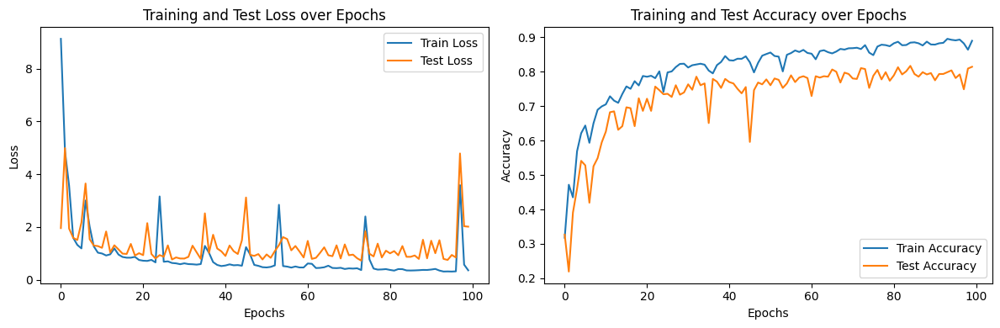

Model saved to Saved/3DGraphz7/lr0.001bs4.pt


GNNModel(
  (conv1): GCNConv(8, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 10)
)

In [75]:
main("3DGraphz7", lr = 0.001, epochs=100, batch_size=4, plot_graphs=True)

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 0/100 => Test Loss: 6.0291, Test Accuracy: 0.1255
Epoch 5/100 => Train Loss: 2.4040, Train Accuracy: 0.5175 | Test Loss: 2.4900, Test Accuracy: 0.4170
Epoch 10/100 => Train Loss: 1.1884, Train Accuracy: 0.6611 | Test Loss: 1.3412, Test Accuracy: 0.5569
Epoch 15/100 => Train Loss: 0.9738, Train Accuracy: 0.7091 | Test Loss: 1.2058, Test Accuracy: 0.5922
Epoch 20/100 => Train Loss: 0.8588, Train Accuracy: 0.7343 | Test Loss: 1.0681, Test Accuracy: 0.6758
Epoch 25/100 => Train Loss: 0.8103, Train Accuracy: 0.7536 | Test Loss: 1.0633, Test Accuracy: 0.6732
Epoch 30/100 => Train Loss: 0.7385, Train Accuracy: 0.7747 | Test Loss: 1.0368, Test Accuracy: 0.7190
Epoch 35/100 => Train Loss: 0.8881, Train Accuracy: 0.7785 | Test Loss: 0.9394, Test Accuracy: 0.7333
Epoch 40/100 => Train Loss: 0.6570, Train Accuracy: 0.7962 | Test Loss: 0.9082, Test Accuracy: 0.7307
Epoch 45/100 => Train Loss: 0.6200, Train Accuracy: 0.8072 | Test Loss: 0.8972, Test Accuracy: 0.7503
Epoch 50/100 => Train Loss:

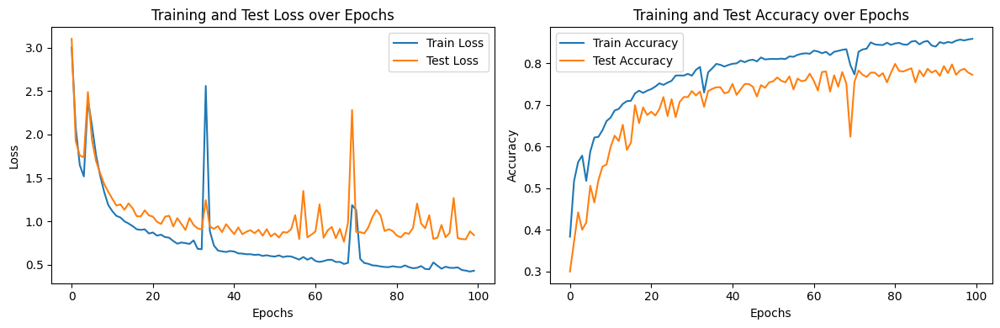

Model saved to Saved/3DGraphz7/lr0.0005bs8.pt


GNNModel(
  (conv1): GCNConv(8, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 10)
)

In [53]:
main("3DGraphz7", epochs=100, batch_size=8, lr=0.0005,plot_graphs=True)

Epoch 0/100 => Test Loss: 4.3548, Test Accuracy: 0.0444
Epoch 5/100 => Train Loss: 1.0856, Train Accuracy: 0.6807 | Test Loss: 1.2935, Test Accuracy: 0.5373
Epoch 10/100 => Train Loss: 1.1444, Train Accuracy: 0.6958 | Test Loss: 1.4316, Test Accuracy: 0.6654
Epoch 15/100 => Train Loss: 0.8008, Train Accuracy: 0.7614 | Test Loss: 1.4196, Test Accuracy: 0.7072
Epoch 20/100 => Train Loss: 0.7591, Train Accuracy: 0.7709 | Test Loss: 0.9419, Test Accuracy: 0.7399
Epoch 25/100 => Train Loss: 0.7044, Train Accuracy: 0.7826 | Test Loss: 0.9812, Test Accuracy: 0.6902
Epoch 30/100 => Train Loss: 0.5925, Train Accuracy: 0.8119 | Test Loss: 0.7991, Test Accuracy: 0.7647
Epoch 35/100 => Train Loss: 0.5384, Train Accuracy: 0.8328 | Test Loss: 0.7826, Test Accuracy: 0.7778
Epoch 40/100 => Train Loss: 0.5544, Train Accuracy: 0.8305 | Test Loss: 0.7518, Test Accuracy: 0.7791
Epoch 45/100 => Train Loss: 0.4844, Train Accuracy: 0.8403 | Test Loss: 1.1195, Test Accuracy: 0.7464
Epoch 50/100 => Train Loss:

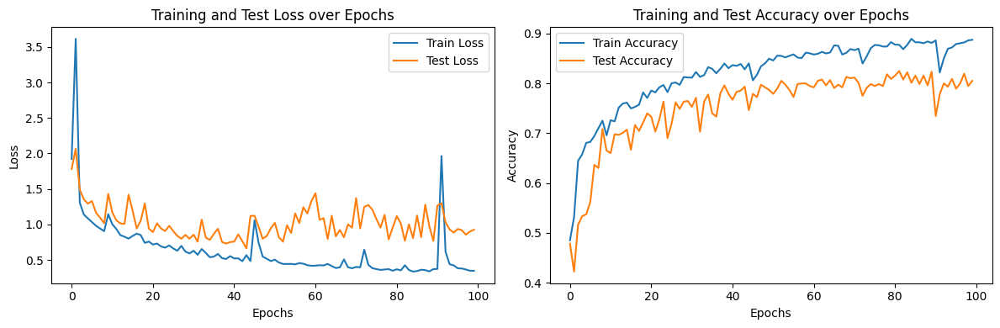

Model saved to Saved/3DGraphz7/lr0.001bs8.pt


GNNModel(
  (conv1): GCNConv(8, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 10)
)

In [54]:
main("3DGraphz7", epochs=100, batch_size=8, lr=0.001,plot_graphs=True)

Epoch 0/100 => Test Loss: 5.2014, Test Accuracy: 0.0719
Epoch 5/100 => Train Loss: 1.3031, Train Accuracy: 0.6251 | Test Loss: 1.4781, Test Accuracy: 0.5281
Epoch 10/100 => Train Loss: 0.9848, Train Accuracy: 0.6952 | Test Loss: 1.2415, Test Accuracy: 0.5882
Epoch 15/100 => Train Loss: 1.1090, Train Accuracy: 0.6848 | Test Loss: 1.2300, Test Accuracy: 0.6418
Epoch 20/100 => Train Loss: 0.8377, Train Accuracy: 0.7545 | Test Loss: 1.0213, Test Accuracy: 0.6915
Epoch 25/100 => Train Loss: 0.7603, Train Accuracy: 0.7586 | Test Loss: 1.0369, Test Accuracy: 0.6810
Epoch 30/100 => Train Loss: 0.6874, Train Accuracy: 0.7864 | Test Loss: 0.9991, Test Accuracy: 0.7046
Epoch 35/100 => Train Loss: 0.7285, Train Accuracy: 0.7848 | Test Loss: 1.4327, Test Accuracy: 0.7163
Epoch 40/100 => Train Loss: 0.6169, Train Accuracy: 0.7996 | Test Loss: 0.8674, Test Accuracy: 0.7464
Epoch 45/100 => Train Loss: 0.5946, Train Accuracy: 0.8088 | Test Loss: 0.9502, Test Accuracy: 0.7059
Epoch 50/100 => Train Loss:

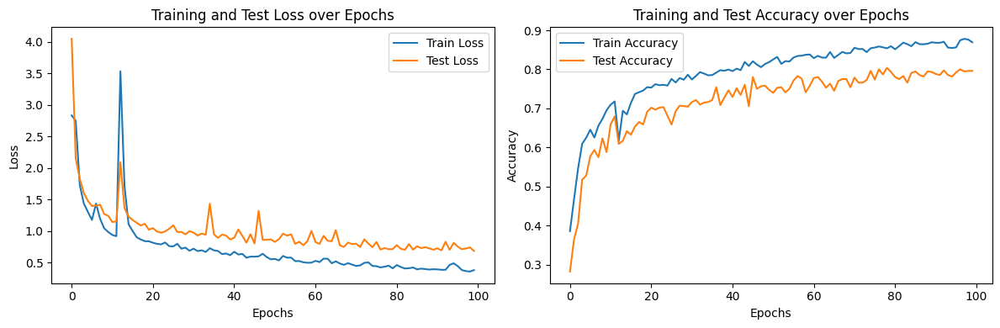

Model saved to Saved/3DGraphz7/lr0.001bs16.pt


GNNModel(
  (conv1): GCNConv(8, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 10)
)

In [55]:
main("3DGraphz7", epochs=100, batch_size=16, lr=0.001,plot_graphs=True)

Epoch 0/100 => Test Loss: 5.7343, Test Accuracy: 0.1163
Epoch 5/100 => Train Loss: 1.2186, Train Accuracy: 0.6551 | Test Loss: 1.4559, Test Accuracy: 0.5895
Epoch 10/100 => Train Loss: 0.9818, Train Accuracy: 0.7226 | Test Loss: 1.1200, Test Accuracy: 0.6954
Epoch 15/100 => Train Loss: 0.7886, Train Accuracy: 0.7659 | Test Loss: 0.9785, Test Accuracy: 0.6732
Epoch 20/100 => Train Loss: 0.6753, Train Accuracy: 0.7927 | Test Loss: 0.9277, Test Accuracy: 0.7451
Epoch 25/100 => Train Loss: 0.5549, Train Accuracy: 0.8309 | Test Loss: 1.1414, Test Accuracy: 0.7242
Epoch 30/100 => Train Loss: 0.4971, Train Accuracy: 0.8419 | Test Loss: 0.8139, Test Accuracy: 0.7804
Epoch 35/100 => Train Loss: 0.4664, Train Accuracy: 0.8463 | Test Loss: 1.1806, Test Accuracy: 0.7660
Epoch 40/100 => Train Loss: 1.0107, Train Accuracy: 0.8094 | Test Loss: 1.0940, Test Accuracy: 0.7686
Epoch 45/100 => Train Loss: 0.4398, Train Accuracy: 0.8637 | Test Loss: 0.9152, Test Accuracy: 0.7739
Epoch 50/100 => Train Loss:

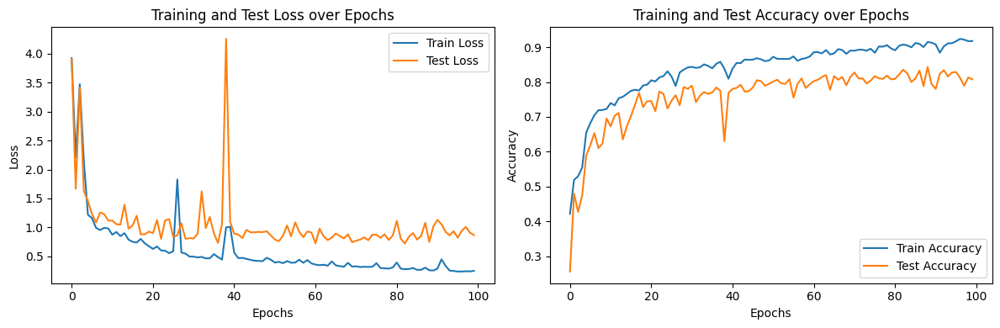

Model saved to Saved/3DGraphz7/lr0.001bs4.pt


GNNModel(
  (conv1): GCNConv(8, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 10)
)

In [56]:
main("3DGraphz7", epochs=100, batch_size=4, lr=0.001,plot_graphs=True)

Epoch 0/40 => Test Loss: 3.5391, Test Accuracy: 0.0667
Epoch 5/40 => Train Loss: 1.2087, Train Accuracy: 0.6444 | Test Loss: 1.3069, Test Accuracy: 0.5320
Epoch 10/40 => Train Loss: 0.9453, Train Accuracy: 0.7053 | Test Loss: 1.1544, Test Accuracy: 0.6065
Epoch 15/40 => Train Loss: 0.8352, Train Accuracy: 0.7485 | Test Loss: 0.9647, Test Accuracy: 0.7255
Epoch 20/40 => Train Loss: 0.7614, Train Accuracy: 0.7712 | Test Loss: 0.9910, Test Accuracy: 0.7320
Epoch 25/40 => Train Loss: 0.7312, Train Accuracy: 0.7804 | Test Loss: 0.9404, Test Accuracy: 0.7373
Epoch 30/40 => Train Loss: 0.6625, Train Accuracy: 0.7977 | Test Loss: 0.9730, Test Accuracy: 0.7307
Epoch 35/40 => Train Loss: 0.6090, Train Accuracy: 0.8097 | Test Loss: 0.9138, Test Accuracy: 0.7333
Epoch 40/40 => Train Loss: 0.5334, Train Accuracy: 0.8293 | Test Loss: 0.8409, Test Accuracy: 0.7725


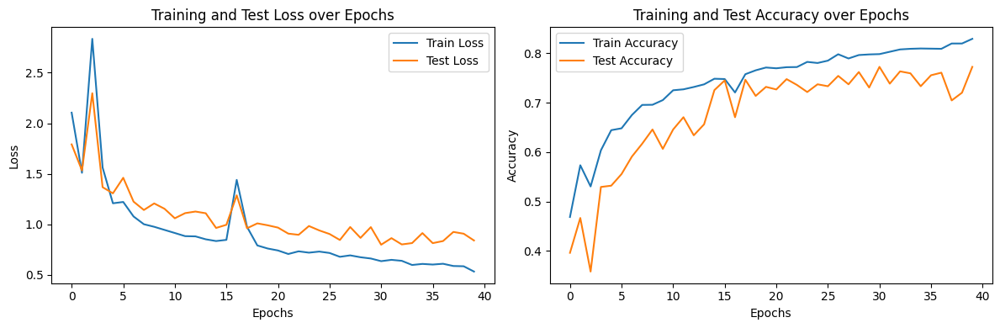

Model saved to Saved/3DGraphz7/lr0.0005bs4.pt


In [58]:
model = main("3DGraphz7", epochs=40, batch_size=4, lr=0.0005,plot_graphs=True)

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 1/10 => Train Loss: 0.5523, Train Accuracy: 0.8287 | Test Loss: 0.8944, Test Accuracy: 0.7386
Epoch 2/10 => Train Loss: 0.5574, Train Accuracy: 0.8261 | Test Loss: 0.8269, Test Accuracy: 0.7791
Epoch 3/10 => Train Loss: 0.5276, Train Accuracy: 0.8331 | Test Loss: 0.8550, Test Accuracy: 0.7582
Epoch 4/10 => Train Loss: 0.5783, Train Accuracy: 0.8236 | Test Loss: 0.8255, Test Accuracy: 0.7765
Epoch 5/10 => Train Loss: 0.5344, Train Accuracy: 0.8378 | Test Loss: 0.8149, Test Accuracy: 0.7791
Epoch 6/10 => Train Loss: 0.5086, Train Accuracy: 0.8391 | Test Loss: 0.7887, Test Accuracy: 0.7830
Epoch 7/10 => Train Loss: 0.5385, Train Accuracy: 0.8353 | Test Loss: 0.8629, Test Accuracy: 0.7817
Epoch 8/10 => Train Loss: 0.5069, Train Accuracy: 0.8328 | Test Loss: 0.7725, Test Accuracy: 0.7817
Epoch 9/10 => Train Loss: 0.5176, Train Accuracy: 0.8343 | Test Loss: 0.8372, Test Accuracy: 0.7634
Epoch 10/10 => Train Loss: 0.4889, Train Accuracy: 0.8435 | Test Loss: 0.7326, Test Accuracy: 0.7830

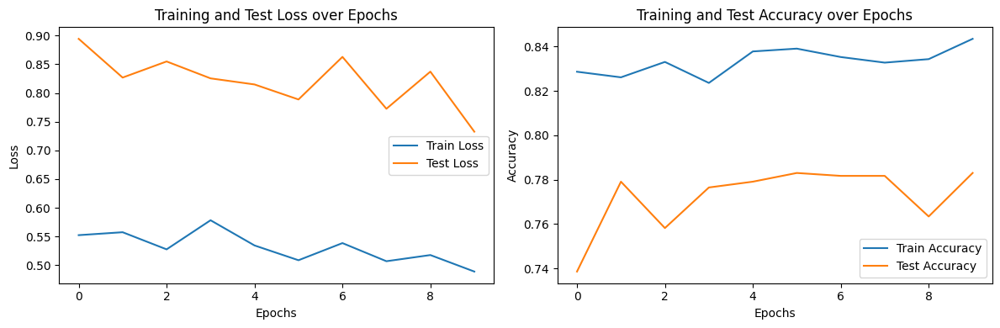

Model saved to main.pt


In [59]:
model = train_further(model, "3DGraphz7", epochs=10, batch_size=4, lr=0.0005,plot_graphs=True, output_path='main.pt')

Epoch 1/5 => Train Loss: 0.4849, Train Accuracy: 0.8447 | Test Loss: 0.7780, Test Accuracy: 0.7752
Epoch 2/5 => Train Loss: 0.5076, Train Accuracy: 0.8457 | Test Loss: 0.8394, Test Accuracy: 0.7582
Epoch 3/5 => Train Loss: 0.4914, Train Accuracy: 0.8504 | Test Loss: 0.7692, Test Accuracy: 0.7882
Epoch 4/5 => Train Loss: 0.4639, Train Accuracy: 0.8498 | Test Loss: 0.7670, Test Accuracy: 0.7843
Epoch 5/5 => Train Loss: 0.4642, Train Accuracy: 0.8558 | Test Loss: 0.7345, Test Accuracy: 0.7791


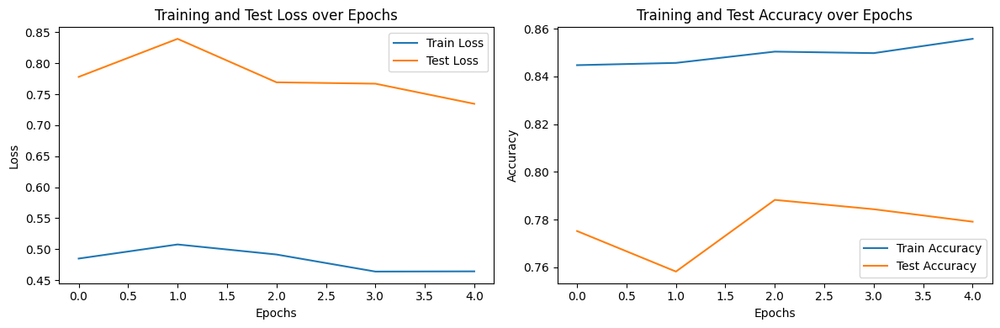

Model saved to main1.pt


In [60]:
model = train_further(model, "3DGraphz7", epochs=5, batch_size=4, lr=0.0005,plot_graphs=True, output_path='main1.pt')

Epoch 1/10 => Train Loss: 0.4600, Train Accuracy: 0.8511 | Test Loss: 0.7602, Test Accuracy: 0.7895
Epoch 2/10 => Train Loss: 0.4601, Train Accuracy: 0.8574 | Test Loss: 0.7645, Test Accuracy: 0.7778
Epoch 3/10 => Train Loss: 0.4741, Train Accuracy: 0.8507 | Test Loss: 0.7429, Test Accuracy: 0.7869
Epoch 4/10 => Train Loss: 0.7022, Train Accuracy: 0.8447 | Test Loss: 2.9929, Test Accuracy: 0.6444
Epoch 5/10 => Train Loss: 0.6990, Train Accuracy: 0.8242 | Test Loss: 0.8537, Test Accuracy: 0.7660
Epoch 6/10 => Train Loss: 0.4759, Train Accuracy: 0.8552 | Test Loss: 0.7924, Test Accuracy: 0.7935
Epoch 7/10 => Train Loss: 0.4449, Train Accuracy: 0.8665 | Test Loss: 0.7624, Test Accuracy: 0.7987
Epoch 8/10 => Train Loss: 0.4287, Train Accuracy: 0.8618 | Test Loss: 0.7596, Test Accuracy: 0.7974
Epoch 9/10 => Train Loss: 0.4227, Train Accuracy: 0.8634 | Test Loss: 0.7410, Test Accuracy: 0.7830
Epoch 10/10 => Train Loss: 0.4206, Train Accuracy: 0.8621 | Test Loss: 0.7549, Test Accuracy: 0.7987

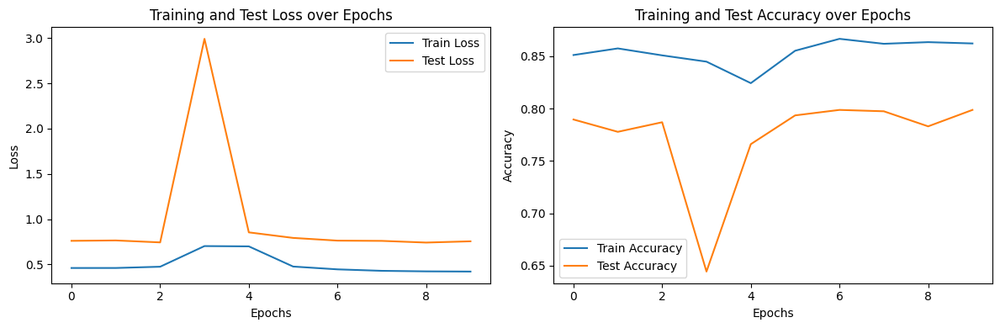

Model saved to main2.pt


In [61]:
model = train_further(model, "3DGraphz7", epochs=10, batch_size=4, lr=0.0005,plot_graphs=True, output_path='main2.pt')

In [31]:
model = load_model('Saved/3DGraphz7/lr0.001bs8.pt','3DGraphz7',evaluate_model=True)

Model loaded from Saved/3DGraphz7/lr0.001bs8.pt
Test Loss: 0.8193, Test Accuracy: 0.7869


In [33]:
model = train_further(model,'3DGraphz7', lr=0.01, epochs=10, batch_size=2, plot_graphs=False, output_path = 'extra.pt')

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 5/10 => Train Loss: 2.4318, Train Accuracy: 0.6642 | Test Loss: 1.2109, Test Accuracy: 0.6444
Epoch 10/10 => Train Loss: 0.8797, Train Accuracy: 0.7274 | Test Loss: 1.1081, Test Accuracy: 0.6196
Model saved to extra.pt


c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 0/100 => Test Loss: 7.4959, Test Accuracy: 0.0680
Epoch 5/100 => Train Loss: 1.1667, Train Accuracy: 0.6494 | Test Loss: 1.2969, Test Accuracy: 0.5268
Epoch 10/100 => Train Loss: 0.9238, Train Accuracy: 0.7135 | Test Loss: 1.0402, Test Accuracy: 0.6824
Epoch 15/100 => Train Loss: 1.0223, Train Accuracy: 0.7277 | Test Loss: 1.1311, Test Accuracy: 0.6627
Epoch 20/100 => Train Loss: 0.8069, Train Accuracy: 0.7690 | Test Loss: 0.9820, Test Accuracy: 0.7098
Epoch 25/100 => Train Loss: 0.7326, Train Accuracy: 0.7744 | Test Loss: 0.9194, Test Accuracy: 0.6941
Epoch 30/100 => Train Loss: 0.7086, Train Accuracy: 0.7927 | Test Loss: 0.8500, Test Accuracy: 0.7503
Epoch 35/100 => Train Loss: 0.6719, Train Accuracy: 0.7977 | Test Loss: 0.8586, Test Accuracy: 0.7346
Epoch 40/100 => Train Loss: 0.6223, Train Accuracy: 0.7990 | Test Loss: 0.8360, Test Accuracy: 0.7399
Epoch 45/100 => Train Loss: 0.6176, Train Accuracy: 0.8100 | Test Loss: 0.8251, Test Accuracy: 0.7582
Epoch 50/100 => Train Loss:

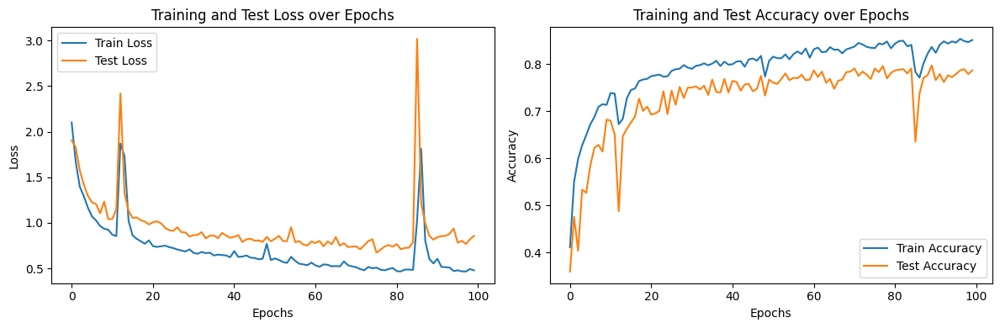

Model saved to Saved/3DGraphz7/lr0.001bs32.pt


In [83]:
main("3DGraphz7", lr = 0.001, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 7.1465, Test Accuracy: 0.0924
Epoch 5/100 => Train Loss: 2.3184, Train Accuracy: 0.5333 | Test Loss: 2.0565, Test Accuracy: 0.4819
Epoch 10/100 => Train Loss: 1.2146, Train Accuracy: 0.6701 | Test Loss: 1.3356, Test Accuracy: 0.5680
Epoch 15/100 => Train Loss: 0.9996, Train Accuracy: 0.7100 | Test Loss: 1.1346, Test Accuracy: 0.6317
Epoch 20/100 => Train Loss: 0.8937, Train Accuracy: 0.7466 | Test Loss: 1.0206, Test Accuracy: 0.6317
Epoch 25/100 => Train Loss: 0.8923, Train Accuracy: 0.7504 | Test Loss: 1.0682, Test Accuracy: 0.6579
Epoch 30/100 => Train Loss: 0.7254, Train Accuracy: 0.7825 | Test Loss: 0.8688, Test Accuracy: 0.7241
Epoch 35/100 => Train Loss: 0.6802, Train Accuracy: 0.7948 | Test Loss: 0.9572, Test Accuracy: 0.6991
Epoch 40/100 => Train Loss: 0.6569, Train Accuracy: 0.7999 | Test Loss: 0.8195, Test Accuracy: 0.7191
Epoch 45/100 => Train Loss: 0.6615, Train Accuracy: 0.8098 | Test Loss: 0.8132, Test Accuracy: 0.7503
Epoch 50/100 => Train Loss:

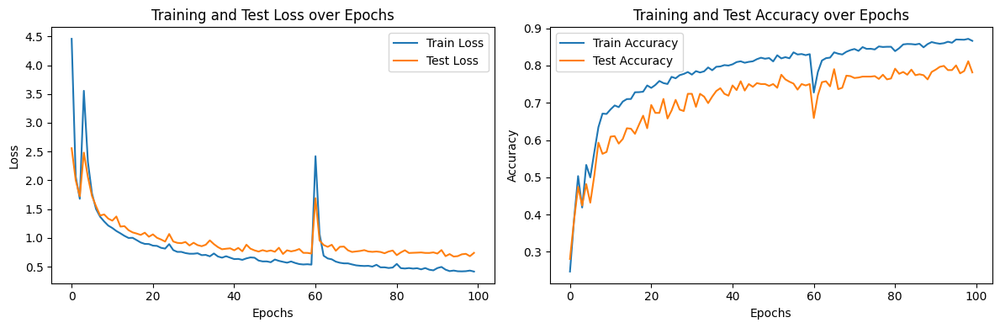

Model saved to Saved/3DGraphy7/lr0.001bs32.pt


In [84]:
main("3DGraphy7", lr = 0.001, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 5.5312, Test Accuracy: 0.0593
Epoch 5/100 => Train Loss: 1.5209, Train Accuracy: 0.5123 | Test Loss: 1.6824, Test Accuracy: 0.3801
Epoch 10/100 => Train Loss: 1.2735, Train Accuracy: 0.5843 | Test Loss: 1.6171, Test Accuracy: 0.3902
Epoch 15/100 => Train Loss: 1.0395, Train Accuracy: 0.6742 | Test Loss: 1.2100, Test Accuracy: 0.6035
Epoch 20/100 => Train Loss: 0.9252, Train Accuracy: 0.7091 | Test Loss: 1.0762, Test Accuracy: 0.6439
Epoch 25/100 => Train Loss: 0.8539, Train Accuracy: 0.7312 | Test Loss: 1.0071, Test Accuracy: 0.6667
Epoch 30/100 => Train Loss: 1.1450, Train Accuracy: 0.7115 | Test Loss: 1.4686, Test Accuracy: 0.6465
Epoch 35/100 => Train Loss: 0.8655, Train Accuracy: 0.7388 | Test Loss: 1.0459, Test Accuracy: 0.6780
Epoch 40/100 => Train Loss: 0.8010, Train Accuracy: 0.7507 | Test Loss: 1.0212, Test Accuracy: 0.6907
Epoch 45/100 => Train Loss: 0.7471, Train Accuracy: 0.7662 | Test Loss: 0.9610, Test Accuracy: 0.6944
Epoch 50/100 => Train Loss:

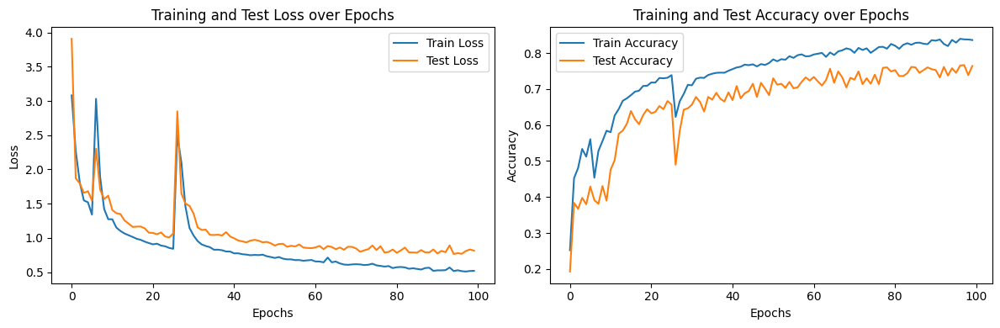

Model saved to Saved/3DGraphx7/lr0.001bs32.pt


In [85]:
main("3DGraphx7", lr = 0.001, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 7.2582, Test Accuracy: 0.0915
Epoch 5/100 => Train Loss: 1.9479, Train Accuracy: 0.5772 | Test Loss: 2.2410, Test Accuracy: 0.4275
Epoch 10/100 => Train Loss: 0.9090, Train Accuracy: 0.7204 | Test Loss: 1.1678, Test Accuracy: 0.6497
Epoch 15/100 => Train Loss: 0.7176, Train Accuracy: 0.7766 | Test Loss: 0.9590, Test Accuracy: 0.7242
Epoch 20/100 => Train Loss: 1.8442, Train Accuracy: 0.6728 | Test Loss: 1.7704, Test Accuracy: 0.6458
Epoch 25/100 => Train Loss: 1.1042, Train Accuracy: 0.7321 | Test Loss: 1.1533, Test Accuracy: 0.6915
Epoch 30/100 => Train Loss: 1.4031, Train Accuracy: 0.7375 | Test Loss: 2.5779, Test Accuracy: 0.6732
Epoch 35/100 => Train Loss: 0.8118, Train Accuracy: 0.7794 | Test Loss: 1.1542, Test Accuracy: 0.7124
Epoch 40/100 => Train Loss: 0.8535, Train Accuracy: 0.7857 | Test Loss: 1.1756, Test Accuracy: 0.7033
Epoch 45/100 => Train Loss: 0.6287, Train Accuracy: 0.8176 | Test Loss: 1.0886, Test Accuracy: 0.7294
Epoch 50/100 => Train Loss:

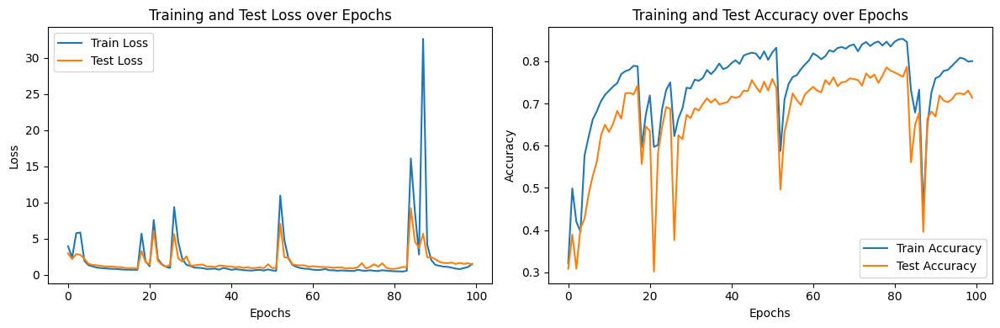

Model saved to Saved/3DGraphz7/lr0.005bs32.pt


In [86]:
main("3DGraphz7", lr = 0.005, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 4.0280, Test Accuracy: 0.0974
Epoch 5/100 => Train Loss: 2.0746, Train Accuracy: 0.5909 | Test Loss: 1.9959, Test Accuracy: 0.5431
Epoch 10/100 => Train Loss: 0.8991, Train Accuracy: 0.7681 | Test Loss: 1.1155, Test Accuracy: 0.7104
Epoch 15/100 => Train Loss: 0.7065, Train Accuracy: 0.8056 | Test Loss: 0.9864, Test Accuracy: 0.6866
Epoch 20/100 => Train Loss: 0.6158, Train Accuracy: 0.8206 | Test Loss: 0.8572, Test Accuracy: 0.7578
Epoch 25/100 => Train Loss: 4.1880, Train Accuracy: 0.7016 | Test Loss: 7.6585, Test Accuracy: 0.4994
Epoch 30/100 => Train Loss: 0.8678, Train Accuracy: 0.7897 | Test Loss: 1.0272, Test Accuracy: 0.7278
Epoch 35/100 => Train Loss: 11.6466, Train Accuracy: 0.5606 | Test Loss: 2.3676, Test Accuracy: 0.6629
Epoch 40/100 => Train Loss: 1.1821, Train Accuracy: 0.7897 | Test Loss: 1.1989, Test Accuracy: 0.7403
Epoch 45/100 => Train Loss: 0.9722, Train Accuracy: 0.8113 | Test Loss: 1.0566, Test Accuracy: 0.7366
Epoch 50/100 => Train Loss

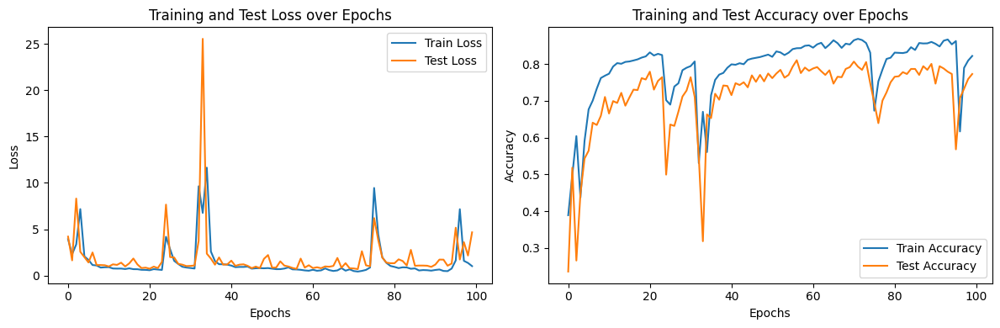

Model saved to Saved/3DGraphy7/lr0.005bs32.pt


In [87]:
main("3DGraphy7", lr = 0.005, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 5.9035, Test Accuracy: 0.1263
Epoch 5/100 => Train Loss: 1.6363, Train Accuracy: 0.5612 | Test Loss: 1.7032, Test Accuracy: 0.5126
Epoch 10/100 => Train Loss: 3.2358, Train Accuracy: 0.6250 | Test Loss: 25.2181, Test Accuracy: 0.1970
Epoch 15/100 => Train Loss: 1.1453, Train Accuracy: 0.6884 | Test Loss: 1.2500, Test Accuracy: 0.6616
Epoch 20/100 => Train Loss: 0.8258, Train Accuracy: 0.7531 | Test Loss: 1.0385, Test Accuracy: 0.6856
Epoch 25/100 => Train Loss: 0.8671, Train Accuracy: 0.7610 | Test Loss: 0.9791, Test Accuracy: 0.7222
Epoch 30/100 => Train Loss: 2.2506, Train Accuracy: 0.6657 | Test Loss: 1.9501, Test Accuracy: 0.5896
Epoch 35/100 => Train Loss: 15.1119, Train Accuracy: 0.5147 | Test Loss: 5.5812, Test Accuracy: 0.5429
Epoch 40/100 => Train Loss: 1.1758, Train Accuracy: 0.7367 | Test Loss: 1.3233, Test Accuracy: 0.6894
Epoch 45/100 => Train Loss: 0.7566, Train Accuracy: 0.7826 | Test Loss: 1.8640, Test Accuracy: 0.7184
Epoch 50/100 => Train Los

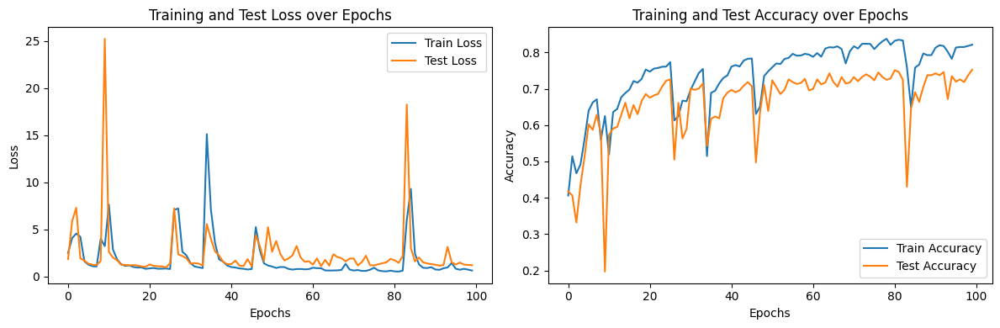

Model saved to Saved/3DGraphx7/lr0.005bs32.pt


In [88]:
main("3DGraphx7", lr = 0.005, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 4.5910, Test Accuracy: 0.0824
Epoch 5/100 => Train Loss: 0.8664, Train Accuracy: 0.7185 | Test Loss: 1.3375, Test Accuracy: 0.5948
Epoch 10/100 => Train Loss: 1.6337, Train Accuracy: 0.6194 | Test Loss: 1.3730, Test Accuracy: 0.5948
Epoch 15/100 => Train Loss: 0.6834, Train Accuracy: 0.7804 | Test Loss: 1.2521, Test Accuracy: 0.6784
Epoch 20/100 => Train Loss: 0.6314, Train Accuracy: 0.8025 | Test Loss: 0.8590, Test Accuracy: 0.7346
Epoch 25/100 => Train Loss: 0.5689, Train Accuracy: 0.8173 | Test Loss: 0.7929, Test Accuracy: 0.7556
Epoch 30/100 => Train Loss: 0.4686, Train Accuracy: 0.8413 | Test Loss: 0.7468, Test Accuracy: 0.7739
Epoch 35/100 => Train Loss: 0.5267, Train Accuracy: 0.8271 | Test Loss: 1.1630, Test Accuracy: 0.7085
Epoch 40/100 => Train Loss: 0.4667, Train Accuracy: 0.8425 | Test Loss: 0.9586, Test Accuracy: 0.7608
Epoch 45/100 => Train Loss: 0.4246, Train Accuracy: 0.8586 | Test Loss: 0.8317, Test Accuracy: 0.7739
Epoch 50/100 => Train Loss:

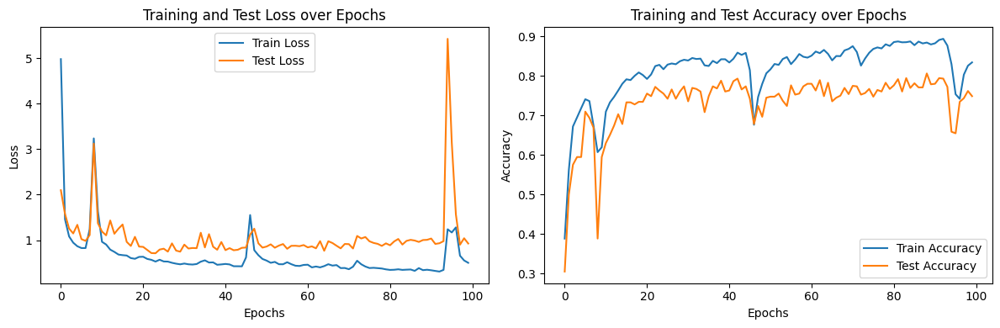

Model saved to Saved/3DGraphz7/lr0.01bs32.pt


In [89]:
main("3DGraphz7", lr = 0.01, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 5.4213, Test Accuracy: 0.1061
Epoch 5/100 => Train Loss: 1.2413, Train Accuracy: 0.6734 | Test Loss: 1.1686, Test Accuracy: 0.6055
Epoch 10/100 => Train Loss: 2.7541, Train Accuracy: 0.6965 | Test Loss: 3.9378, Test Accuracy: 0.4432
Epoch 15/100 => Train Loss: 28.0419, Train Accuracy: 0.4742 | Test Loss: 8.9115, Test Accuracy: 0.4519
Epoch 20/100 => Train Loss: 3.5369, Train Accuracy: 0.6857 | Test Loss: 3.1141, Test Accuracy: 0.6592
Epoch 25/100 => Train Loss: 1.2738, Train Accuracy: 0.7942 | Test Loss: 3.6657, Test Accuracy: 0.7066
Epoch 30/100 => Train Loss: 0.8835, Train Accuracy: 0.8086 | Test Loss: 1.2384, Test Accuracy: 0.7353
Epoch 35/100 => Train Loss: 0.6797, Train Accuracy: 0.8335 | Test Loss: 1.0467, Test Accuracy: 0.7566
Epoch 40/100 => Train Loss: 0.6450, Train Accuracy: 0.8311 | Test Loss: 0.9513, Test Accuracy: 0.7391
Epoch 45/100 => Train Loss: 0.5276, Train Accuracy: 0.8491 | Test Loss: 0.9293, Test Accuracy: 0.7765
Epoch 50/100 => Train Loss

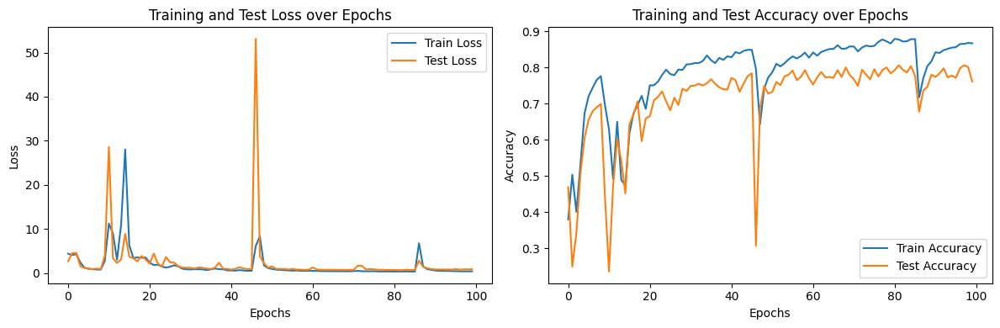

Model saved to Saved/3DGraphy7/lr0.01bs32.pt


In [90]:
main("3DGraphy7", lr = 0.01, epochs=100, batch_size=32, plot_graphs=True)

Epoch 0/100 => Test Loss: 4.3865, Test Accuracy: 0.1540
Epoch 5/100 => Train Loss: 1.4928, Train Accuracy: 0.6134 | Test Loss: 1.2979, Test Accuracy: 0.6111
Epoch 10/100 => Train Loss: 0.8009, Train Accuracy: 0.7437 | Test Loss: 0.9223, Test Accuracy: 0.7008
Epoch 15/100 => Train Loss: 0.7127, Train Accuracy: 0.7765 | Test Loss: 0.9090, Test Accuracy: 0.6831
Epoch 20/100 => Train Loss: 0.5925, Train Accuracy: 0.8123 | Test Loss: 0.8789, Test Accuracy: 0.7109
Epoch 25/100 => Train Loss: 0.8147, Train Accuracy: 0.7537 | Test Loss: 0.9936, Test Accuracy: 0.7184
Epoch 30/100 => Train Loss: 0.6416, Train Accuracy: 0.8102 | Test Loss: 0.8637, Test Accuracy: 0.7235
Epoch 35/100 => Train Loss: 0.5334, Train Accuracy: 0.8327 | Test Loss: 0.7857, Test Accuracy: 0.7652
Epoch 40/100 => Train Loss: 0.4784, Train Accuracy: 0.8427 | Test Loss: 0.7465, Test Accuracy: 0.7727
Epoch 45/100 => Train Loss: 0.5027, Train Accuracy: 0.8403 | Test Loss: 0.7441, Test Accuracy: 0.7487
Epoch 50/100 => Train Loss:

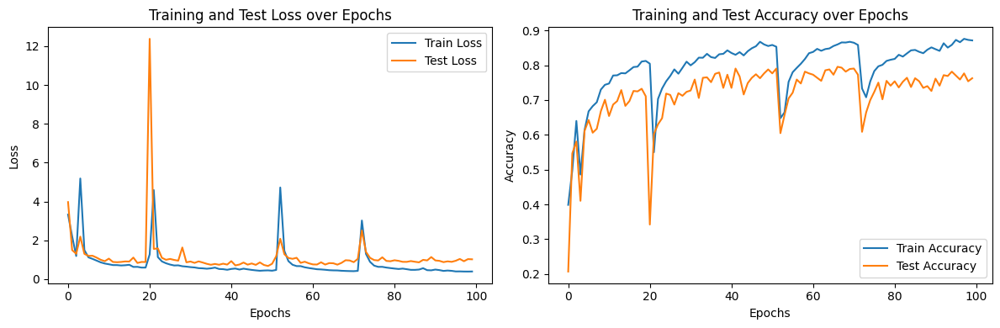

Model saved to Saved/3DGraphx7/lr0.01bs32.pt


In [91]:
main("3DGraphx7", lr = 0.01, epochs=100, batch_size=32, plot_graphs=True)

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 0/250 => Test Loss: 4.5208, Test Accuracy: 0.0593
Epoch 5/250 => Train Loss: 1.4532, Train Accuracy: 0.5673 | Test Loss: 1.9570, Test Accuracy: 0.3889
Epoch 10/250 => Train Loss: 1.3824, Train Accuracy: 0.5742 | Test Loss: 1.4629, Test Accuracy: 0.5505
Epoch 15/250 => Train Loss: 1.0090, Train Accuracy: 0.6869 | Test Loss: 1.2110, Test Accuracy: 0.5568
Epoch 20/250 => Train Loss: 0.9134, Train Accuracy: 0.7082 | Test Loss: 1.2445, Test Accuracy: 0.6338
Epoch 25/250 => Train Loss: 0.8434, Train Accuracy: 0.7312 | Test Loss: 1.1365, Test Accuracy: 0.6629
Epoch 30/250 => Train Loss: 0.8045, Train Accuracy: 0.7464 | Test Loss: 1.1502, Test Accuracy: 0.6528
Epoch 35/250 => Train Loss: 0.7516, Train Accuracy: 0.7613 | Test Loss: 1.2874, Test Accuracy: 0.7008
Epoch 40/250 => Train Loss: 0.8816, Train Accuracy: 0.7431 | Test Loss: 1.1046, Test Accuracy: 0.6566
Epoch 45/250 => Train Loss: 0.7357, Train Accuracy: 0.7634 | Test Loss: 0.9655, Test Accuracy: 0.7008
Epoch 50/250 => Train Loss:

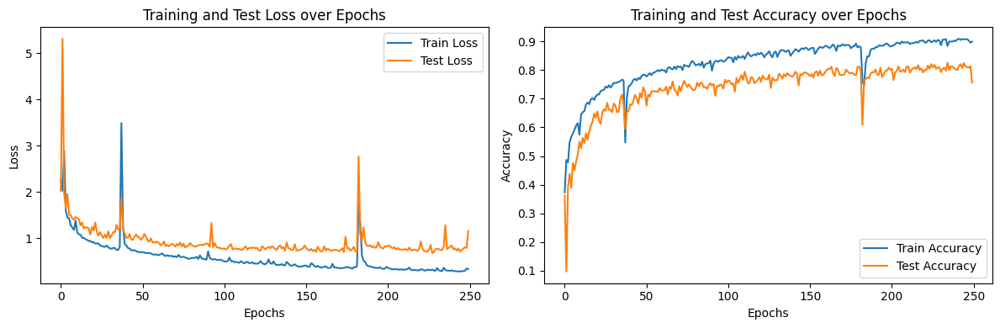

Model saved to Saved/3DGraphx7/lr0.001bs32.pt


In [12]:
main("3DGraphx7", lr = 0.001, epochs=250, batch_size=32, plot_graphs=True)

Epoch 0/200 => Test Loss: 5.8648, Test Accuracy: 0.0833
Epoch 5/200 => Train Loss: 2.1699, Train Accuracy: 0.4321 | Test Loss: 2.1059, Test Accuracy: 0.3434
Epoch 10/200 => Train Loss: 1.1415, Train Accuracy: 0.6465 | Test Loss: 1.2719, Test Accuracy: 0.5732
Epoch 15/200 => Train Loss: 0.9549, Train Accuracy: 0.6975 | Test Loss: 1.0928, Test Accuracy: 0.6439
Epoch 20/200 => Train Loss: 1.8136, Train Accuracy: 0.6757 | Test Loss: 7.3139, Test Accuracy: 0.2311
Epoch 25/200 => Train Loss: 0.8748, Train Accuracy: 0.7416 | Test Loss: 0.9941, Test Accuracy: 0.6907
Epoch 30/200 => Train Loss: 0.7940, Train Accuracy: 0.7568 | Test Loss: 1.0505, Test Accuracy: 0.6616
Epoch 35/200 => Train Loss: 0.7723, Train Accuracy: 0.7631 | Test Loss: 0.9464, Test Accuracy: 0.6818
Epoch 40/200 => Train Loss: 0.7123, Train Accuracy: 0.7771 | Test Loss: 0.9671, Test Accuracy: 0.7134
Epoch 45/200 => Train Loss: 0.7029, Train Accuracy: 0.7777 | Test Loss: 0.9417, Test Accuracy: 0.7058
Epoch 50/200 => Train Loss:

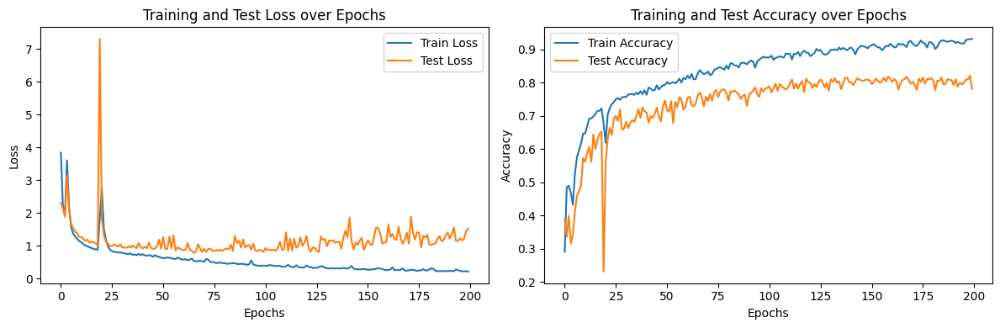

Model saved to Saved/3DGraphx7/lr0.001bs16.pt


In [15]:
main("3DGraphx7", lr = 0.001, epochs=200, batch_size=16, plot_graphs=True)

Epoch 0/150 => Test Loss: 5.9025, Test Accuracy: 0.1072
Epoch 5/150 => Train Loss: 1.1703, Train Accuracy: 0.6362 | Test Loss: 1.2961, Test Accuracy: 0.5150
Epoch 10/150 => Train Loss: 1.4524, Train Accuracy: 0.6762 | Test Loss: 1.4185, Test Accuracy: 0.5699
Epoch 15/150 => Train Loss: 0.9110, Train Accuracy: 0.7173 | Test Loss: 1.1592, Test Accuracy: 0.6196
Epoch 20/150 => Train Loss: 0.8196, Train Accuracy: 0.7435 | Test Loss: 1.0313, Test Accuracy: 0.6837
Epoch 25/150 => Train Loss: 0.7614, Train Accuracy: 0.7580 | Test Loss: 1.1120, Test Accuracy: 0.6549
Epoch 30/150 => Train Loss: 0.6870, Train Accuracy: 0.7832 | Test Loss: 0.9723, Test Accuracy: 0.6824
Epoch 35/150 => Train Loss: 0.6400, Train Accuracy: 0.7996 | Test Loss: 1.0831, Test Accuracy: 0.6863
Epoch 40/150 => Train Loss: 0.6761, Train Accuracy: 0.7971 | Test Loss: 1.1298, Test Accuracy: 0.7229
Epoch 45/150 => Train Loss: 0.5800, Train Accuracy: 0.8145 | Test Loss: 1.2171, Test Accuracy: 0.7346
Epoch 50/150 => Train Loss:

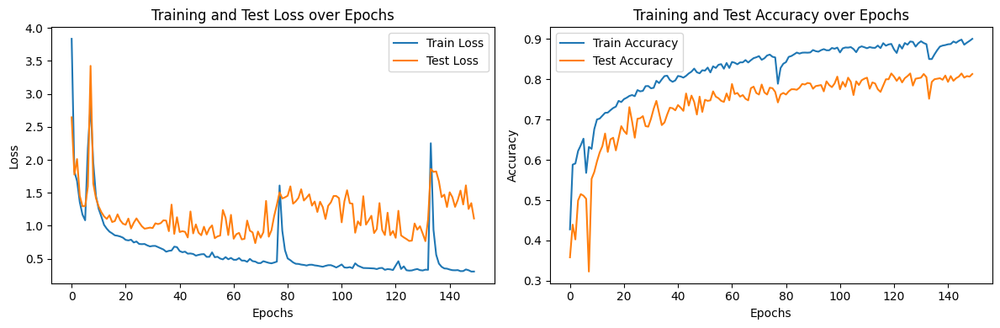

Model saved to Saved/3DGraphz7/lr0.001bs16.pt


In [18]:
main("3DGraphz7", lr = 0.001, epochs=150, batch_size=16, plot_graphs=True)

Epoch 0/150 => Test Loss: 3.8420, Test Accuracy: 0.0967
Epoch 5/150 => Train Loss: 3.2106, Train Accuracy: 0.3825 | Test Loss: 2.3541, Test Accuracy: 0.3007
Epoch 10/150 => Train Loss: 1.2739, Train Accuracy: 0.6157 | Test Loss: 1.4674, Test Accuracy: 0.4693
Epoch 15/150 => Train Loss: 1.0771, Train Accuracy: 0.6636 | Test Loss: 1.2726, Test Accuracy: 0.5490
Epoch 20/150 => Train Loss: 0.9611, Train Accuracy: 0.6993 | Test Loss: 1.1685, Test Accuracy: 0.6209
Epoch 25/150 => Train Loss: 0.8787, Train Accuracy: 0.7340 | Test Loss: 1.1004, Test Accuracy: 0.6575
Epoch 30/150 => Train Loss: 0.8276, Train Accuracy: 0.7501 | Test Loss: 1.0234, Test Accuracy: 0.6928
Epoch 35/150 => Train Loss: 0.7700, Train Accuracy: 0.7681 | Test Loss: 0.9881, Test Accuracy: 0.6889
Epoch 40/150 => Train Loss: 0.7342, Train Accuracy: 0.7709 | Test Loss: 0.9666, Test Accuracy: 0.7007
Epoch 45/150 => Train Loss: 0.7100, Train Accuracy: 0.7813 | Test Loss: 0.9445, Test Accuracy: 0.7098
Epoch 50/150 => Train Loss:

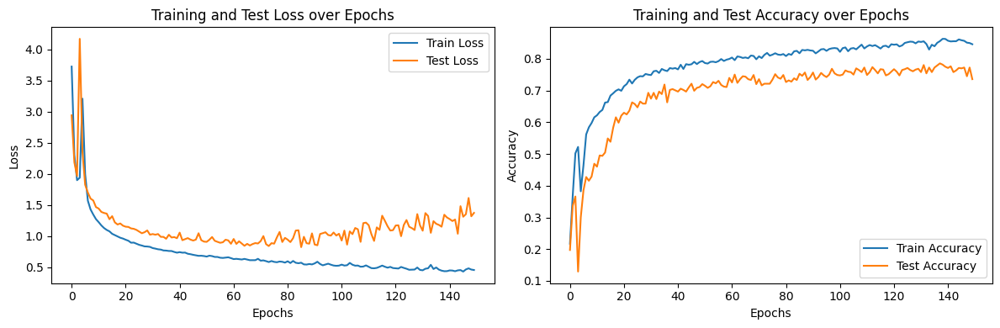

Model saved to Saved/3DGraphz7/lr0.001bs64.pt


In [19]:
main("3DGraphz7", lr = 0.001, epochs=150, batch_size=64, plot_graphs=True)

Epoch 0/200 => Test Loss: 6.4279, Test Accuracy: 0.0693
Epoch 5/200 => Train Loss: 1.8607, Train Accuracy: 0.6418 | Test Loss: 1.3569, Test Accuracy: 0.5804
Epoch 10/200 => Train Loss: 3.7282, Train Accuracy: 0.6945 | Test Loss: 1.5334, Test Accuracy: 0.6444
Epoch 15/200 => Train Loss: 1.7786, Train Accuracy: 0.7507 | Test Loss: 12.8941, Test Accuracy: 0.2863
Epoch 20/200 => Train Loss: 0.7170, Train Accuracy: 0.7898 | Test Loss: 1.1540, Test Accuracy: 0.7294
Epoch 25/200 => Train Loss: 0.6902, Train Accuracy: 0.7977 | Test Loss: 0.9261, Test Accuracy: 0.7516
Epoch 30/200 => Train Loss: 0.6293, Train Accuracy: 0.8069 | Test Loss: 0.9233, Test Accuracy: 0.7294
Epoch 35/200 => Train Loss: 0.5559, Train Accuracy: 0.8381 | Test Loss: 0.8115, Test Accuracy: 0.7608
Epoch 40/200 => Train Loss: 0.4572, Train Accuracy: 0.8520 | Test Loss: 0.8383, Test Accuracy: 0.7922
Epoch 45/200 => Train Loss: 0.4738, Train Accuracy: 0.8482 | Test Loss: 0.8582, Test Accuracy: 0.7699
Epoch 50/200 => Train Loss

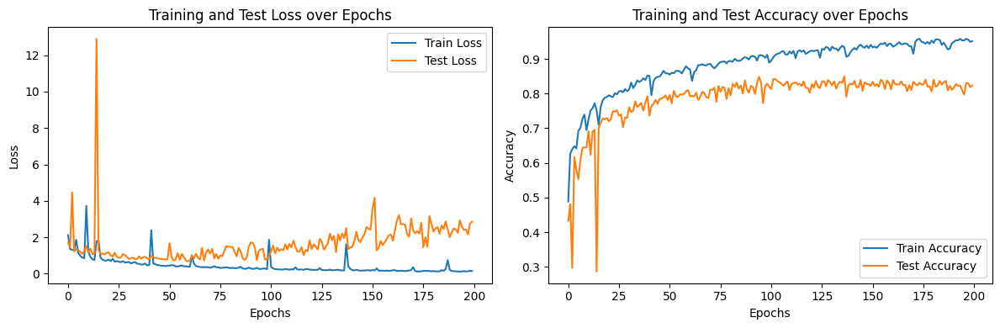

Model saved to Saved/3DGraphz7/lr0.001bs4.pt


In [21]:
main("3DGraphz7", lr = 0.001, epochs=200, batch_size=4, plot_graphs=True)

Epoch 0/100 => Test Loss: 4.9671, Test Accuracy: 0.0575
Epoch 5/100 => Train Loss: 1.9705, Train Accuracy: 0.6264 | Test Loss: 1.4423, Test Accuracy: 0.5373
Epoch 10/100 => Train Loss: 1.0480, Train Accuracy: 0.7179 | Test Loss: 1.4221, Test Accuracy: 0.6418
Epoch 15/100 => Train Loss: 3.4466, Train Accuracy: 0.6702 | Test Loss: 4.3178, Test Accuracy: 0.6196
Epoch 20/100 => Train Loss: 0.7895, Train Accuracy: 0.7854 | Test Loss: 1.0389, Test Accuracy: 0.7399
Epoch 25/100 => Train Loss: 0.8416, Train Accuracy: 0.7842 | Test Loss: 1.4540, Test Accuracy: 0.7007
Epoch 30/100 => Train Loss: 0.8086, Train Accuracy: 0.7939 | Test Loss: 0.9926, Test Accuracy: 0.7307
Epoch 35/100 => Train Loss: 0.7210, Train Accuracy: 0.8122 | Test Loss: 1.1026, Test Accuracy: 0.7307
Epoch 40/100 => Train Loss: 0.6521, Train Accuracy: 0.8173 | Test Loss: 0.9273, Test Accuracy: 0.7608
Epoch 45/100 => Train Loss: 0.5549, Train Accuracy: 0.8359 | Test Loss: 0.8958, Test Accuracy: 0.7712
Epoch 50/100 => Train Loss:

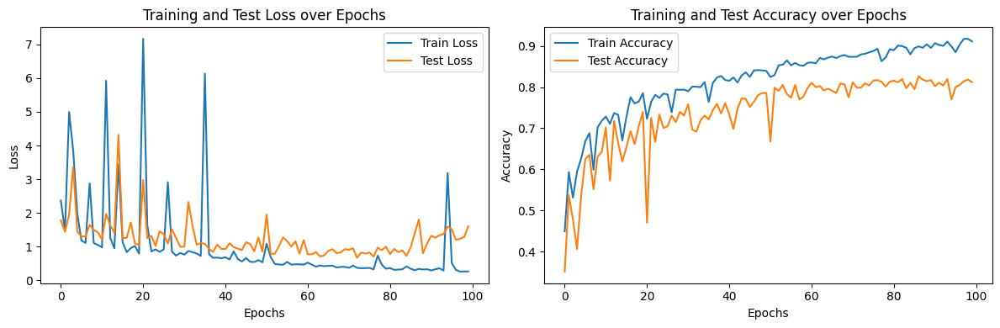

Model saved to Saved/3DGraphz7/lr0.001bs2.pt


In [22]:
main("3DGraphz7", lr = 0.001, epochs=100, batch_size=2, plot_graphs=True)

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 0/100 => Test Loss: 4.5131, Test Accuracy: 0.0954
Epoch 5/100 => Train Loss: 2.3544, Train Accuracy: 0.6084 | Test Loss: 1.6933, Test Accuracy: 0.5699
Epoch 10/100 => Train Loss: 0.9126, Train Accuracy: 0.7135 | Test Loss: 1.2835, Test Accuracy: 0.6405
Epoch 15/100 => Train Loss: 2.3950, Train Accuracy: 0.6775 | Test Loss: 1.6441, Test Accuracy: 0.6314
Epoch 20/100 => Train Loss: 0.7819, Train Accuracy: 0.7599 | Test Loss: 1.0681, Test Accuracy: 0.6837
Epoch 25/100 => Train Loss: 2.1515, Train Accuracy: 0.7403 | Test Loss: 2.6334, Test Accuracy: 0.6510
Epoch 30/100 => Train Loss: 0.8368, Train Accuracy: 0.7608 | Test Loss: 1.0317, Test Accuracy: 0.7072
Epoch 35/100 => Train Loss: 0.7391, Train Accuracy: 0.7829 | Test Loss: 0.8791, Test Accuracy: 0.7425
Epoch 40/100 => Train Loss: 0.7359, Train Accuracy: 0.7845 | Test Loss: 0.9399, Test Accuracy: 0.7438
Epoch 45/100 => Train Loss: 0.6289, Train Accuracy: 0.8053 | Test Loss: 0.9339, Test Accuracy: 0.7529
Epoch 50/100 => Train Loss:

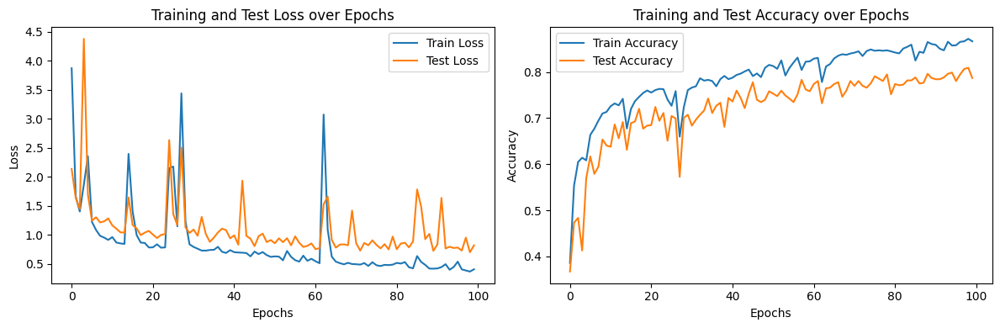

Model saved to Saved/3DGraphz7/lr0.001bs8.pt


In [10]:
main("3DGraphz7", lr = 0.001, epochs=100, batch_size=8, plot_graphs=True)

In [40]:
load_model('Saved/3DGraphz7/lr0.001bs2.pt','3DGraphz7',evaluate_model=True)

Model loaded from Saved/3DGraphz7/lr0.001bs2.pt
Test Loss: 1.5940, Test Accuracy: 0.8118


GNNModel(
  (conv1): GCNConv(8, 64)
  (conv2): GCNConv(64, 64)
  (conv3): GCNConv(64, 10)
)

Epoch 0/50 => Test Loss: 6.9374, Test Accuracy: 0.0601
Epoch 5/50 => Train Loss: 1.1853, Train Accuracy: 0.6513 | Test Loss: 1.3464, Test Accuracy: 0.5673
Epoch 10/50 => Train Loss: 0.9539, Train Accuracy: 0.7210 | Test Loss: 1.1752, Test Accuracy: 0.6588
Epoch 15/50 => Train Loss: 0.8088, Train Accuracy: 0.7536 | Test Loss: 1.0067, Test Accuracy: 0.7176
Epoch 20/50 => Train Loss: 0.7100, Train Accuracy: 0.7835 | Test Loss: 1.6966, Test Accuracy: 0.6876
Epoch 25/50 => Train Loss: 0.7525, Train Accuracy: 0.7870 | Test Loss: 1.0148, Test Accuracy: 0.7190
Epoch 30/50 => Train Loss: 0.6359, Train Accuracy: 0.7996 | Test Loss: 0.9963, Test Accuracy: 0.7111
Epoch 35/50 => Train Loss: 0.7366, Train Accuracy: 0.7999 | Test Loss: 0.8908, Test Accuracy: 0.7412
Epoch 40/50 => Train Loss: 2.8709, Train Accuracy: 0.7169 | Test Loss: 1.5709, Test Accuracy: 0.6824
Epoch 45/50 => Train Loss: 0.6228, Train Accuracy: 0.8148 | Test Loss: 1.0057, Test Accuracy: 0.7176
Epoch 50/50 => Train Loss: 0.5859, Tr

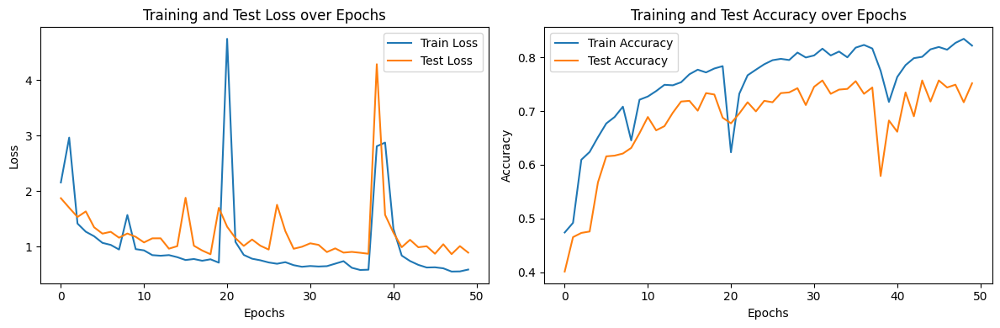

Model saved to Saved/3DGraphz7/lr0.002bs16.pt


In [46]:
main("3DGraphz7", lr = 0.002, epochs=50, batch_size=16, plot_graphs=True)

In [47]:
model = load_model('Saved/3DGraphz7/lr0.002bs16.pt','3DGraphz7',evaluate_model=False)

Model loaded from Saved/3DGraphz7/lr0.002bs16.pt


c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 5/10 => Train Loss: 0.5361, Train Accuracy: 0.8353 | Test Loss: 0.8815, Test Accuracy: 0.7817
Epoch 10/10 => Train Loss: 0.4712, Train Accuracy: 0.8485 | Test Loss: 0.7869, Test Accuracy: 0.7895


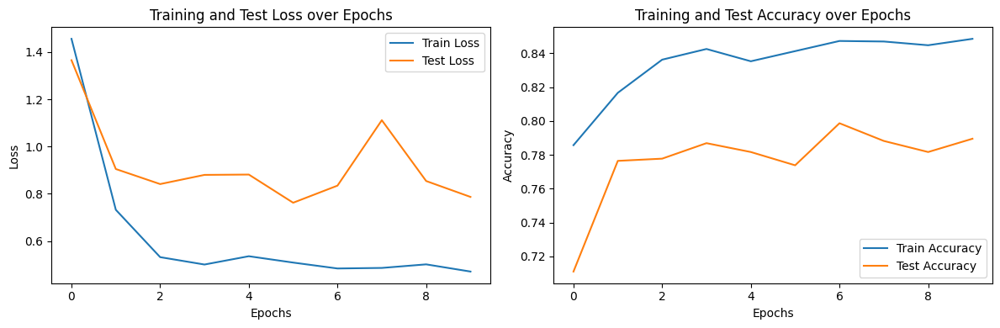

Model saved to further.pt


In [48]:
model = train_further(model, '3DGraphz7', lr=0.001, epochs=10, batch_size=8,plot_graphs=True, output_path='further.pt')

Epoch 1/10 => Train Loss: 0.6583, Train Accuracy: 0.8145 | Test Loss: 0.9510, Test Accuracy: 0.7503
Epoch 2/10 => Train Loss: 0.6261, Train Accuracy: 0.8179 | Test Loss: 0.9814, Test Accuracy: 0.7752
Epoch 3/10 => Train Loss: 0.7016, Train Accuracy: 0.8141 | Test Loss: 0.7697, Test Accuracy: 0.7673
Epoch 4/10 => Train Loss: 0.5383, Train Accuracy: 0.8309 | Test Loss: 0.8698, Test Accuracy: 0.7556
Epoch 5/10 => Train Loss: 0.5825, Train Accuracy: 0.8290 | Test Loss: 0.8093, Test Accuracy: 0.7830
Epoch 6/10 => Train Loss: 0.5572, Train Accuracy: 0.8353 | Test Loss: 0.7991, Test Accuracy: 0.7647
Epoch 7/10 => Train Loss: 0.5007, Train Accuracy: 0.8400 | Test Loss: 0.8126, Test Accuracy: 0.7686
Epoch 8/10 => Train Loss: 0.5633, Train Accuracy: 0.8362 | Test Loss: 1.1767, Test Accuracy: 0.7255
Epoch 9/10 => Train Loss: 0.4895, Train Accuracy: 0.8454 | Test Loss: 1.2001, Test Accuracy: 0.7712
Epoch 10/10 => Train Loss: 0.5259, Train Accuracy: 0.8495 | Test Loss: 0.7396, Test Accuracy: 0.7739

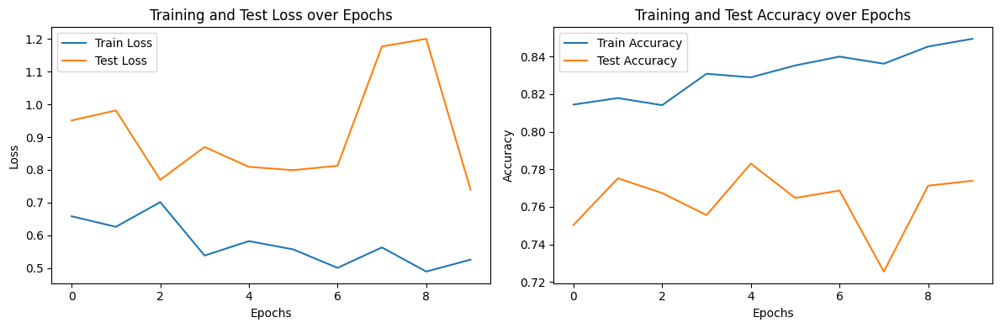

Model saved to further.pt


In [50]:
model = train_further(model, '3DGraphz7', lr=0.001, epochs=10, batch_size=2,plot_graphs=True, output_path='further.pt')

Model loaded from further.pt


c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 1/10 => Train Loss: 0.9272, Train Accuracy: 0.8741 | Test Loss: 0.6894, Test Accuracy: 0.7987
Epoch 2/10 => Train Loss: 0.3705, Train Accuracy: 0.8791 | Test Loss: 0.6798, Test Accuracy: 0.8039
Epoch 3/10 => Train Loss: 0.3633, Train Accuracy: 0.8836 | Test Loss: 0.6826, Test Accuracy: 0.8039
Epoch 4/10 => Train Loss: 0.3574, Train Accuracy: 0.8826 | Test Loss: 0.6759, Test Accuracy: 0.8078
Epoch 5/10 => Train Loss: 0.3542, Train Accuracy: 0.8861 | Test Loss: 0.6771, Test Accuracy: 0.8052
Epoch 6/10 => Train Loss: 0.3494, Train Accuracy: 0.8873 | Test Loss: 0.6950, Test Accuracy: 0.8105
Epoch 7/10 => Train Loss: 0.3475, Train Accuracy: 0.8861 | Test Loss: 0.6963, Test Accuracy: 0.8078
Epoch 8/10 => Train Loss: 0.3440, Train Accuracy: 0.8896 | Test Loss: 0.6729, Test Accuracy: 0.8052
Epoch 9/10 => Train Loss: 0.3416, Train Accuracy: 0.8908 | Test Loss: 0.6684, Test Accuracy: 0.8105
Epoch 10/10 => Train Loss: 0.3390, Train Accuracy: 0.8927 | Test Loss: 0.6715, Test Accuracy: 0.8144

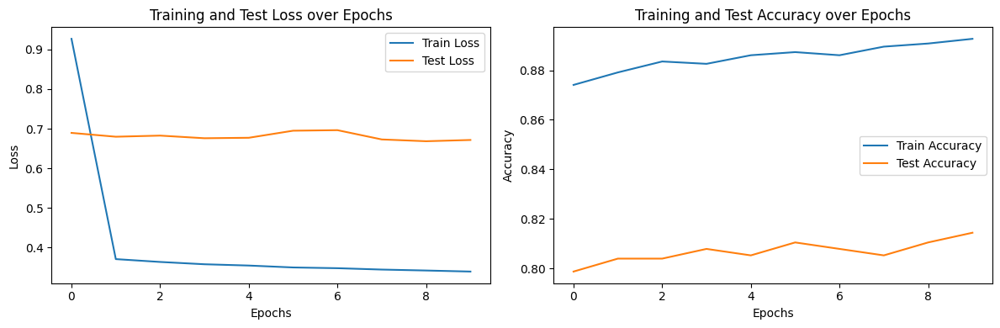

Model saved to further.pt


In [13]:
model = load_model('further.pt','3DGraphz7',evaluate_model=False)
model = train_further(model, '3DGraphz7', lr=0.0001, epochs=10, batch_size=2,plot_graphs=True, output_path='further.pt')

Epoch 1/10 => Train Loss: 0.3281, Train Accuracy: 0.8962 | Test Loss: 0.6749, Test Accuracy: 0.8039
Epoch 2/10 => Train Loss: 0.3258, Train Accuracy: 0.8946 | Test Loss: 0.6779, Test Accuracy: 0.7987
Epoch 3/10 => Train Loss: 0.3257, Train Accuracy: 0.8971 | Test Loss: 0.6767, Test Accuracy: 0.8026
Epoch 4/10 => Train Loss: 0.3332, Train Accuracy: 0.8965 | Test Loss: 0.6772, Test Accuracy: 0.8052
Epoch 5/10 => Train Loss: 0.3236, Train Accuracy: 0.8968 | Test Loss: 0.6761, Test Accuracy: 0.8118
Epoch 6/10 => Train Loss: 0.3224, Train Accuracy: 0.8993 | Test Loss: 0.6752, Test Accuracy: 0.8026
Epoch 7/10 => Train Loss: 0.3224, Train Accuracy: 0.8974 | Test Loss: 0.6719, Test Accuracy: 0.8078
Epoch 8/10 => Train Loss: 0.3198, Train Accuracy: 0.8997 | Test Loss: 0.6735, Test Accuracy: 0.8052
Epoch 9/10 => Train Loss: 0.3192, Train Accuracy: 0.8981 | Test Loss: 0.6795, Test Accuracy: 0.8105
Epoch 10/10 => Train Loss: 0.3178, Train Accuracy: 0.8968 | Test Loss: 0.6782, Test Accuracy: 0.8092

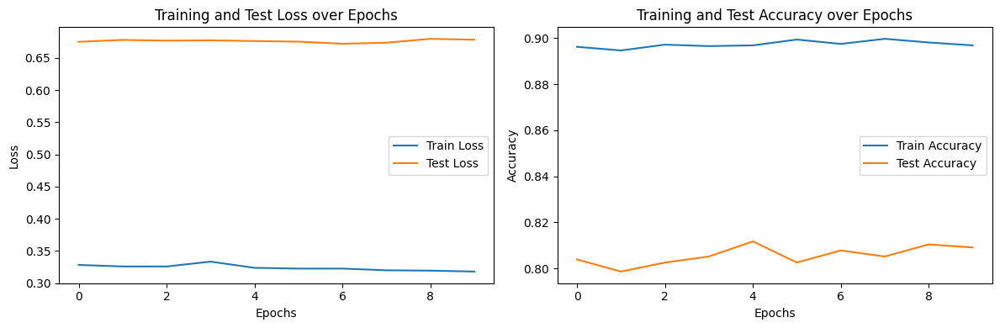

Model saved to _further.pt


In [14]:
model = train_further(model, '3DGraphz7', lr=0.0001, epochs=10, batch_size=16,plot_graphs=True, output_path='_further.pt')

Epoch 1/10 => Train Loss: 0.3608, Train Accuracy: 0.8810 | Test Loss: 0.7034, Test Accuracy: 0.8092
Epoch 2/10 => Train Loss: 0.3472, Train Accuracy: 0.8861 | Test Loss: 0.6805, Test Accuracy: 0.8052
Epoch 3/10 => Train Loss: 0.3468, Train Accuracy: 0.8817 | Test Loss: 0.6805, Test Accuracy: 0.8092
Epoch 4/10 => Train Loss: 0.9182, Train Accuracy: 0.8709 | Test Loss: 1.5657, Test Accuracy: 0.7621
Epoch 5/10 => Train Loss: 0.7342, Train Accuracy: 0.8571 | Test Loss: 0.7927, Test Accuracy: 0.7882
Epoch 6/10 => Train Loss: 0.4292, Train Accuracy: 0.8713 | Test Loss: 0.7152, Test Accuracy: 0.8183
Epoch 7/10 => Train Loss: 0.3727, Train Accuracy: 0.8814 | Test Loss: 0.7099, Test Accuracy: 0.8078
Epoch 8/10 => Train Loss: 0.3614, Train Accuracy: 0.8823 | Test Loss: 0.6883, Test Accuracy: 0.8170
Epoch 9/10 => Train Loss: 0.3463, Train Accuracy: 0.8896 | Test Loss: 0.6677, Test Accuracy: 0.8157
Epoch 10/10 => Train Loss: 0.3372, Train Accuracy: 0.8870 | Test Loss: 0.6899, Test Accuracy: 0.8118

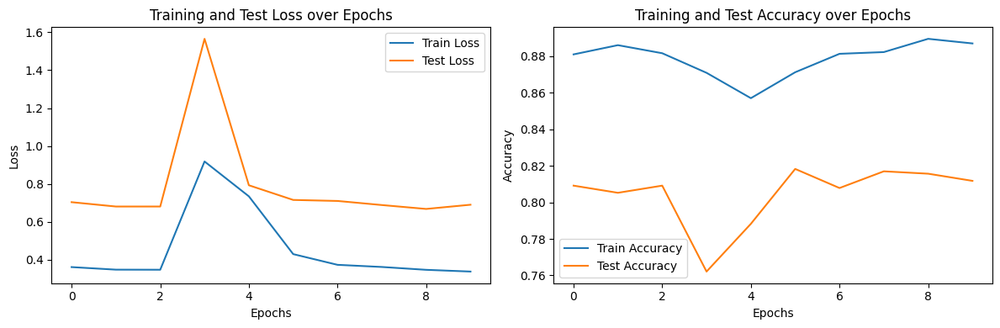

Model saved to _further.pt


In [16]:
model = train_further(model, '3DGraphz7', lr=0.001, epochs=10, batch_size=16,plot_graphs=True, output_path='_further.pt')

Epoch 0/50 => Test Loss: 6.4003, Test Accuracy: 0.1216
Epoch 5/50 => Train Loss: 1.0311, Train Accuracy: 0.6854 | Test Loss: 1.2094, Test Accuracy: 0.6105
Epoch 10/50 => Train Loss: 0.7082, Train Accuracy: 0.7706 | Test Loss: 0.8789, Test Accuracy: 0.6902
Epoch 15/50 => Train Loss: 0.7819, Train Accuracy: 0.7706 | Test Loss: 0.8618, Test Accuracy: 0.6915
Epoch 20/50 => Train Loss: 0.6484, Train Accuracy: 0.7769 | Test Loss: 0.8133, Test Accuracy: 0.7464
Epoch 25/50 => Train Loss: 0.5749, Train Accuracy: 0.8116 | Test Loss: 0.8784, Test Accuracy: 0.7307
Epoch 30/50 => Train Loss: 0.5550, Train Accuracy: 0.8154 | Test Loss: 0.8590, Test Accuracy: 0.7791
Epoch 35/50 => Train Loss: 0.5994, Train Accuracy: 0.8107 | Test Loss: 1.0016, Test Accuracy: 0.7098
Epoch 40/50 => Train Loss: 0.5081, Train Accuracy: 0.8346 | Test Loss: 0.9230, Test Accuracy: 0.7556
Epoch 45/50 => Train Loss: 0.4910, Train Accuracy: 0.8429 | Test Loss: 0.8862, Test Accuracy: 0.7686
Epoch 50/50 => Train Loss: 0.5201, Tr

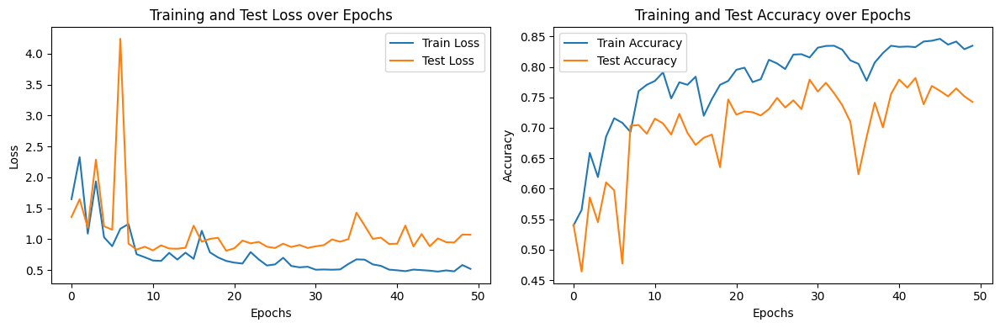

Model saved to Saved/3DGraphz7/lr0.01bs8.pt


In [20]:
model = main("3DGraphz7", lr = 0.01, epochs=50, batch_size=8, plot_graphs=True)

Epoch 0/50 => Test Loss: 3.7339, Test Accuracy: 0.1373
Epoch 5/50 => Train Loss: 1.0975, Train Accuracy: 0.6674 | Test Loss: 1.2602, Test Accuracy: 0.5464
Epoch 10/50 => Train Loss: 1.4360, Train Accuracy: 0.6964 | Test Loss: 1.3718, Test Accuracy: 0.6497
Epoch 15/50 => Train Loss: 0.8766, Train Accuracy: 0.7457 | Test Loss: 1.0203, Test Accuracy: 0.7373
Epoch 20/50 => Train Loss: 0.7533, Train Accuracy: 0.7706 | Test Loss: 1.2543, Test Accuracy: 0.6667
Epoch 25/50 => Train Loss: 0.8489, Train Accuracy: 0.7605 | Test Loss: 0.9486, Test Accuracy: 0.7307
Epoch 30/50 => Train Loss: 0.6624, Train Accuracy: 0.7996 | Test Loss: 0.9662, Test Accuracy: 0.7320
Epoch 35/50 => Train Loss: 0.6337, Train Accuracy: 0.8031 | Test Loss: 0.9016, Test Accuracy: 0.7791
Epoch 40/50 => Train Loss: 0.5752, Train Accuracy: 0.8268 | Test Loss: 0.9935, Test Accuracy: 0.7386
Epoch 45/50 => Train Loss: 0.5651, Train Accuracy: 0.8290 | Test Loss: 0.8007, Test Accuracy: 0.7869
Epoch 50/50 => Train Loss: 0.5132, Tr

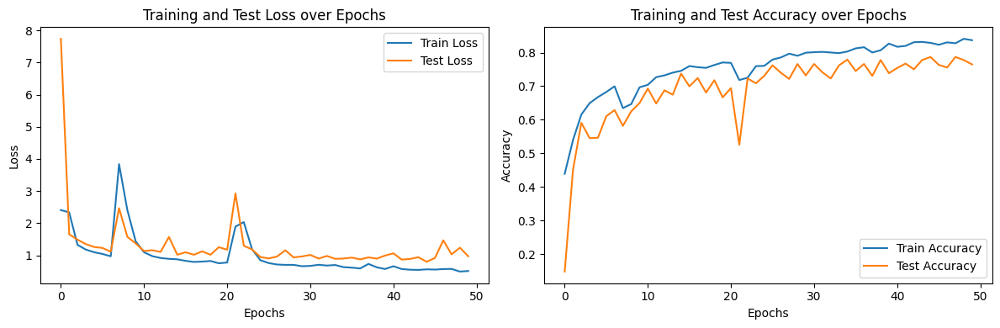

Model saved to Saved/3DGraphz7/lr0.001bs8.pt


In [22]:
model = main("3DGraphz7", lr = 0.001, epochs=50, batch_size=8, plot_graphs=True)

c:\Users\Adeel\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch_geometric\deprecation.py:22: UserWarning: 'data.DataLoader' is deprecated, use 'loader.DataLoader' instead
  warnings.warn(out)


Epoch 1/20 => Train Loss: 0.5176, Train Accuracy: 0.8435 | Test Loss: 1.0613, Test Accuracy: 0.7856
Epoch 2/20 => Train Loss: 0.5597, Train Accuracy: 0.8318 | Test Loss: 1.1287, Test Accuracy: 0.7503
Epoch 3/20 => Train Loss: 0.5312, Train Accuracy: 0.8403 | Test Loss: 1.2007, Test Accuracy: 0.7856
Epoch 4/20 => Train Loss: 0.4766, Train Accuracy: 0.8514 | Test Loss: 0.8330, Test Accuracy: 0.7856
Epoch 5/20 => Train Loss: 0.4532, Train Accuracy: 0.8498 | Test Loss: 1.1041, Test Accuracy: 0.7634
Epoch 6/20 => Train Loss: 0.4760, Train Accuracy: 0.8523 | Test Loss: 1.3047, Test Accuracy: 0.7935
Epoch 7/20 => Train Loss: 0.4397, Train Accuracy: 0.8561 | Test Loss: 1.3442, Test Accuracy: 0.7752
Epoch 8/20 => Train Loss: 0.4676, Train Accuracy: 0.8548 | Test Loss: 1.2452, Test Accuracy: 0.7948
Epoch 9/20 => Train Loss: 0.4993, Train Accuracy: 0.8542 | Test Loss: 0.9334, Test Accuracy: 0.7725
Epoch 10/20 => Train Loss: 0.4451, Train Accuracy: 0.8608 | Test Loss: 0.8435, Test Accuracy: 0.8013

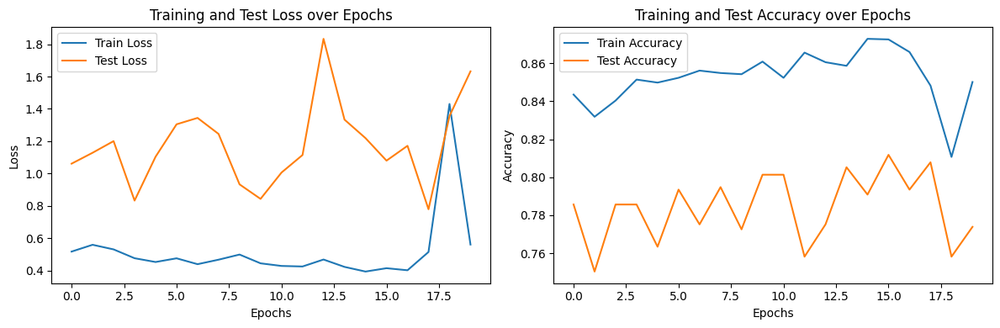

Model saved to default.pt


In [23]:
model = train_further(model, "3DGraphz7", lr = 0.001, epochs=20, batch_size=8, plot_graphs=True)